<a href="https://colab.research.google.com/github/RoyMukta/Data-Science-Research-Project-Part-B/blob/main/Temporal_Tracking_and_Network_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define your project folder path
project_path = "/content/drive/My Drive/Project_N"

In [ ]:

# TEMPORAL TRACKING + MARKOV TRANSITION MODEL


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# LOAD DATA FROM

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)


df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

# Ensure date type
df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')

# Sort chronologically per user
df = df.sort_values(['UserID', 'PostDate'])



#  MAP LABELS → NUMERIC SCORES


depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)



# USER-LEVEL TRAJECTORY SUMMARY TABLE

trajectory_summary = df.groupby("UserID").agg(
    First_Dep=('DepressionScore', 'first'),
    Last_Dep=('DepressionScore', 'last'),
    Dep_Change=('DepressionScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Anx=('AnxietyScore', 'first'),
    Last_Anx=('AnxietyScore', 'last'),
    Anx_Change=('AnxietyScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Sui=('SuicideScore', 'first'),
    Last_Sui=('SuicideScore', 'last'),
    Sui_Change=('SuicideScore', lambda x: x.iloc[-1] - x.iloc[0]),
)

trajectory_summary.to_csv(
    "/content/drive/MyDrive/Project_N/User_Trajectory_Summary.csv"
)


# 4. PLOT SAMPLE USER TRAJECTORIES (FIRST 5 USERS)

sample_users = df['UserID'].unique()[:5]

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicide Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()

    plt.savefig(f"/content/drive/MyDrive/Project_N/User_{u}_Trajectory.png")
    plt.close()




#  MARKOV TRANSITION MODEL


def build_transition_matrix(sequence, num_states):
    """
    Builds a Markov transition matrix with safe division.
    Avoids divide-by-zero warnings.
    """
    matrix = np.zeros((num_states, num_states))

    # Count transitions
    for i in range(len(sequence) - 1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # Safe divide (avoid division by zero)
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix




# DEPRESSION MARKOV MODEL


dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

dep_seq = [t[0] for t in dep_transitions]
matrix_dep = build_transition_matrix(dep_seq, 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Depression_Markov_Heatmap.png")
plt.close()




# ANXIETY MARKOV MODEL


anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

anx_seq = [t[0] for t in anx_transitions]
matrix_anx = build_transition_matrix(anx_seq, 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Anxiety_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Anxiety_Markov_Heatmap.png")
plt.close()




# SUICIDAL RISK MARKOV MODEL


sui_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

sui_seq = [t[0] for t in sui_transitions]
matrix_sui = build_transition_matrix(sui_seq, 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Suicide_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Transition Matrix")
plt.savefig("/content/drive/MyDrive/Project_N/Suicide_Markov_Heatmap.png")
plt.close()


print("Objective 2 completed successfully. All outputs saved to Drive.")


Objective 2 completed successfully. All outputs saved to Drive.


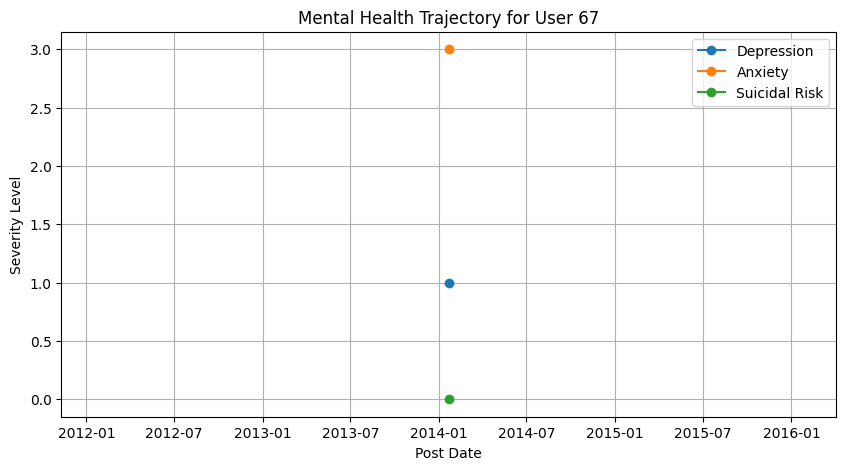

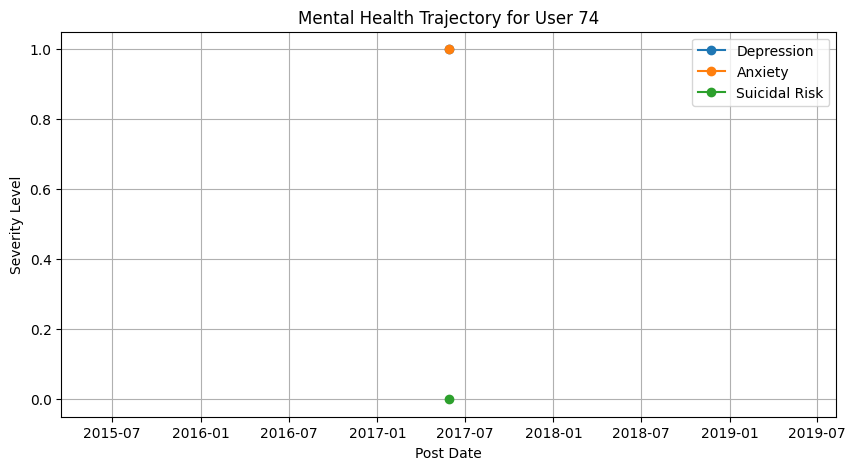

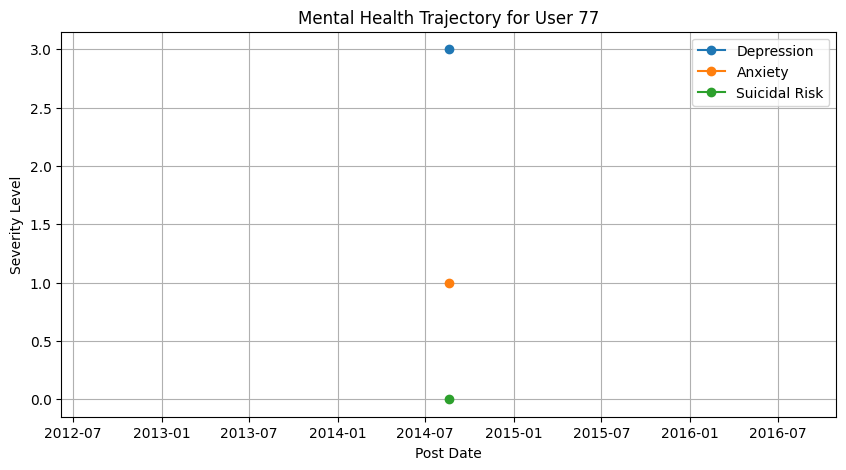

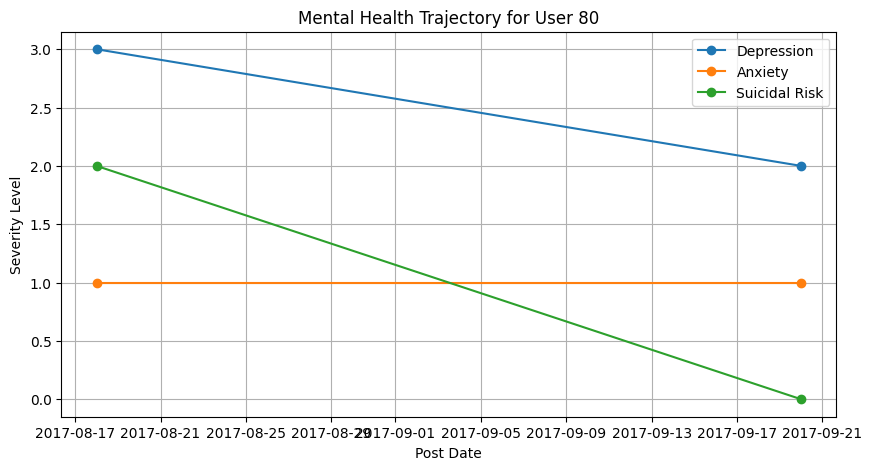

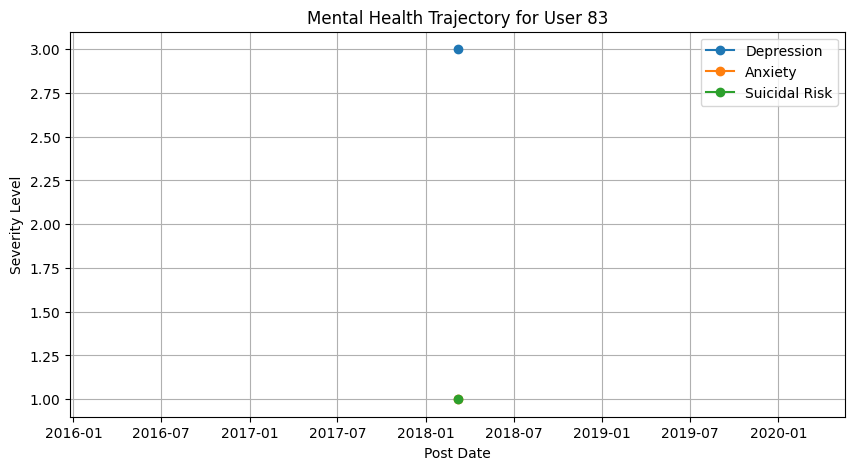

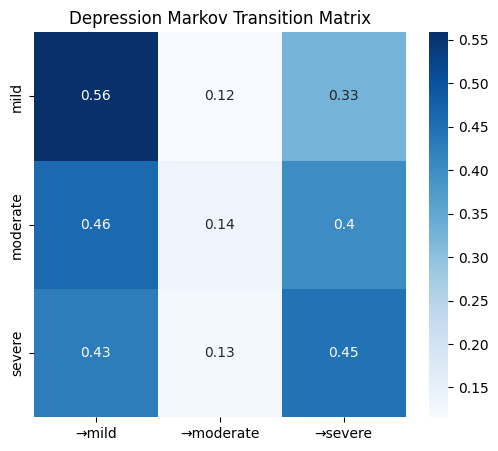

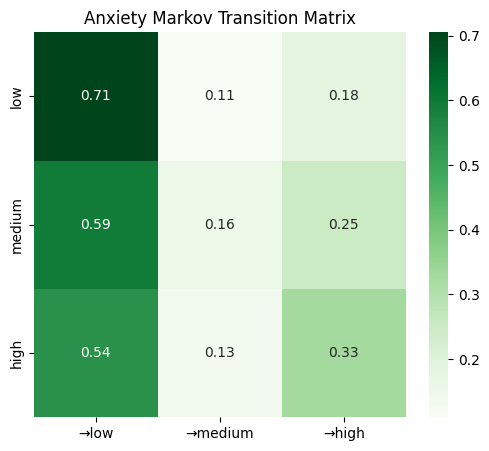

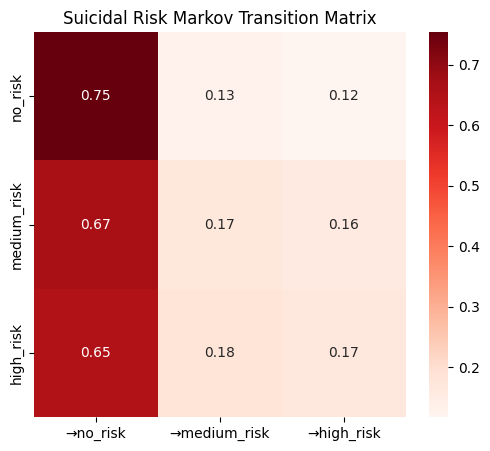

Objective 2 complete. Graphs displayed, CSV files saved to Drive.


In [ ]:

#  TEMPORAL TRACKING + MARKOV TRANSITION MODEL


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# LOAD DATA FROM GOOGLE DRIVE


file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Rename
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

# Parse date
df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')

# Sort by time sequence
df = df.sort_values(['UserID', 'PostDate'])



# MAP LABELS NUMERIC SCORES


depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)



# USER-LEVEL SUMMARY


trajectory_summary = df.groupby("UserID").agg(
    First_Dep=('DepressionScore','first'),
    Last_Dep=('DepressionScore','last'),
    Dep_Change=('DepressionScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Anx=('AnxietyScore','first'),
    Last_Anx=('AnxietyScore','last'),
    Anx_Change=('AnxietyScore', lambda x: x.iloc[-1] - x.iloc[0]),

    First_Sui=('SuicideScore','first'),
    Last_Sui=('SuicideScore','last'),
    Sui_Change=('SuicideScore', lambda x: x.iloc[-1] - x.iloc[0])
)

trajectory_summary.to_csv("/content/drive/MyDrive/Project_N/User_Trajectory_Summary.csv")



# PLOT TRAJECTORIES


sample_users = df['UserID'].unique()[:5]

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()

    plt.show()




# SAFE MARKOV TRANSITION FUNCTION


def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    # Count transitions
    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # Safe divide to avoid warnings
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix




#  DEPRESSION MARKOV MODEL


dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

dep_seq = [t[0] for t in dep_transitions]
matrix_dep = build_transition_matrix(dep_seq, 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.show()




# ANXIETY MARKOV MODEL


anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

anx_seq = [t[0] for t in anx_transitions]
matrix_anx = build_transition_matrix(anx_seq, 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Anxiety_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Transition Matrix")
plt.show()




# SUICIDAL RISK MARKOV MODEL


sui_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

sui_seq = [t[0] for t in sui_transitions]
matrix_sui = build_transition_matrix(sui_seq, 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Suicide_Markov_Transitions.csv")

# DISPLAY HEATMAP
plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Transition Matrix")
plt.show()


print("Objective 2 complete. Graphs displayed, CSV files saved to Drive.")


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")
df.head()


,Post ID,Post Title,Post Content,Post Author,User ID,Post Date,Post Category,admiration,amusement,anger,...,realization,relief,remorse,sadness,surprise,neutral,Top_5_Emotions,Depression,Anxiety,SuicidalThought
0,607679,Hi Check out this post if youre not sure how t...,Hi there and welcome to the Anxiety section of...,BeyondBlue,54597,3/4/2025,Anxiety,0.011947,0.000128,0.000071,...,0.000428,0.000517,0.000090,0.000224,0.000207,0.000667,"gratitude:0.9687, admiration:0.0119, excitemen...",mild,low,no_risk
1,180185,I had a car accident,And it was entirely my own fault I tried cross...,grovi,12724,5/21/2016,Anxiety,0.005364,0.002298,0.004039,...,0.032309,0.006464,0.022705,0.064524,0.001799,0.007187,"fear:0.5752, nervousness:0.1214, sadness:0.064...",mild,high,no_risk
2,516409,Horrible week,Hi everyone Im having a horrible week so just ...,Whatsinaname,7809,9/25/2020,Anxiety,0.002001,0.002999,0.002499,...,0.012879,0.009477,0.007282,0.104841,0.002449,0.021860,"fear:0.2703, optimism:0.2263, nervousness:0.14...",mild,medium,no_risk
3,605332,New relationship anxiety,Dear All Just need a connection to feel the su...,Sammy,52665,1/10/2025,Anxiety,0.012412,0.001048,0.002596,...,0.009246,0.017817,0.067084,0.157380,0.000685,0.005930,"gratitude:0.2129, desire:0.1604, sadness:0.157...",mild,low,no_risk
4,610948,Persistent constant anxiety,Hi there just reaching out to anyone who might...,Beepboop,55341,6/3/2025,Anxiety,0.002594,0.001911,0.001610,...,0.021769,0.006503,0.002845,0.067626,0.001583,0.026680,"nervousness:0.6225, fear:0.1034, sadness:0.067...",mild,high,no_risk


In [ ]:
total_users = df['User ID'].nunique()
print("Total unique users:", total_users)


Total unique users: 18698


In [ ]:
unique_users = df['User ID'].unique()
unique_users


array([54597, 12724,  7809, ..., 46662, 46683, 46673])

In [ ]:
user_post_counts = df.groupby('User ID')['Post ID'].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

user_post_counts


,User ID,PostCount
0,67,1
1,74,1
2,77,1
3,80,2
4,83,1
...,...,...
18693,55446,1
18694,55450,1
18695,55451,1
18696,55462,1


In [ ]:
user_post_counts.to_csv(
    "/content/drive/MyDrive/Project_N/User_Post_Counts.csv",
    index=False
)


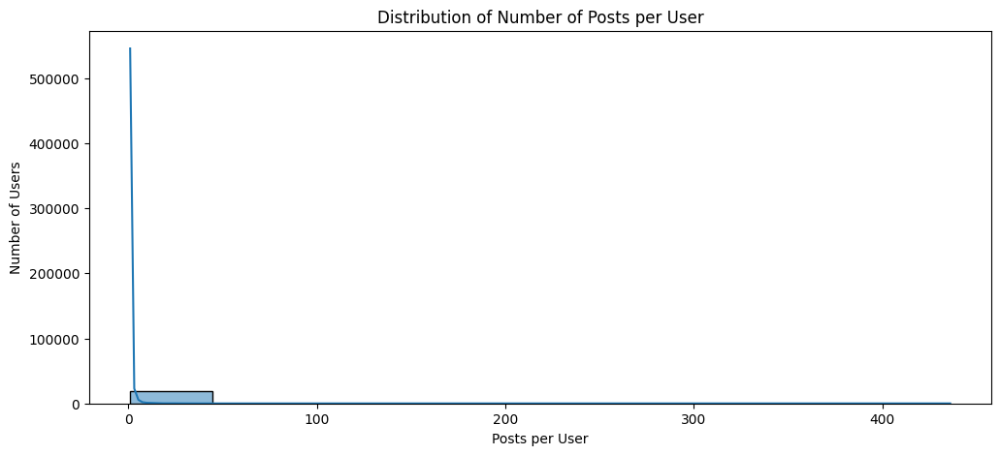

In [ ]:
plt.figure(figsize=(12,5))
sns.histplot(user_post_counts['PostCount'], bins=10, kde=True)
plt.title("Distribution of Number of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Number of Users")
plt.show()


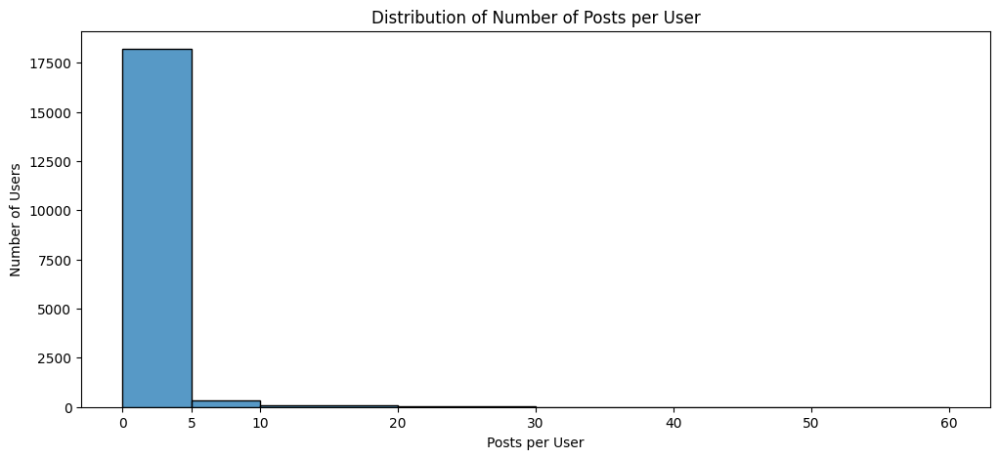

In [ ]:
import numpy as np

# Custom bins
bins = [0, 5, 10, 20, 30, 40, 50, 60]

plt.figure(figsize=(12,5))
sns.histplot(user_post_counts['PostCount'], bins=bins, kde=False, edgecolor='black')
plt.title("Distribution of Number of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Number of Users")
plt.xticks(bins)
plt.show()


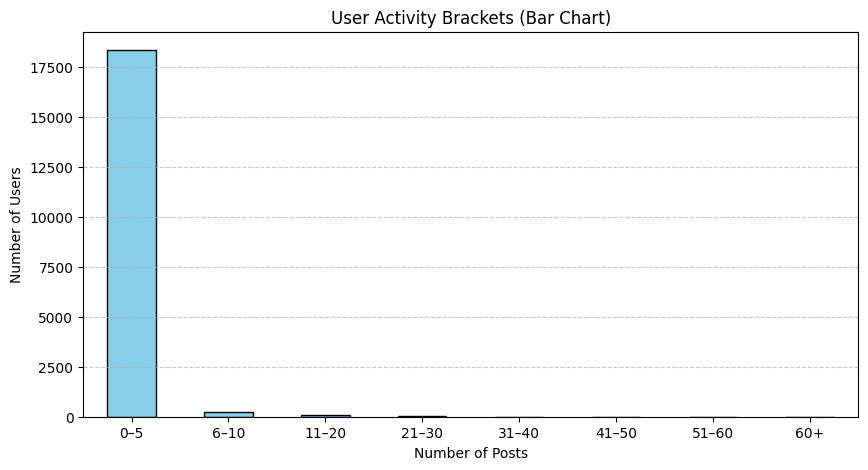

In [ ]:
import numpy as np

# Define bins
bins = [0, 5, 10, 20, 30, 40, 50, 60, user_post_counts['PostCount'].max()]

# Cut users into bins
user_post_counts['Bracket'] = pd.cut(
    user_post_counts['PostCount'],
    bins=bins,
    labels=['0–5','6–10','11–20','21–30','31–40','41–50','51–60','60+'],
    include_lowest=True
)

# Count users per bracket
bracket_counts = user_post_counts['Bracket'].value_counts().sort_index()

# Plot bar chart
plt.figure(figsize=(10,5))
bracket_counts.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title("User Activity Brackets (Bar Chart)")
plt.xlabel("Number of Posts")
plt.ylabel("Number of Users")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


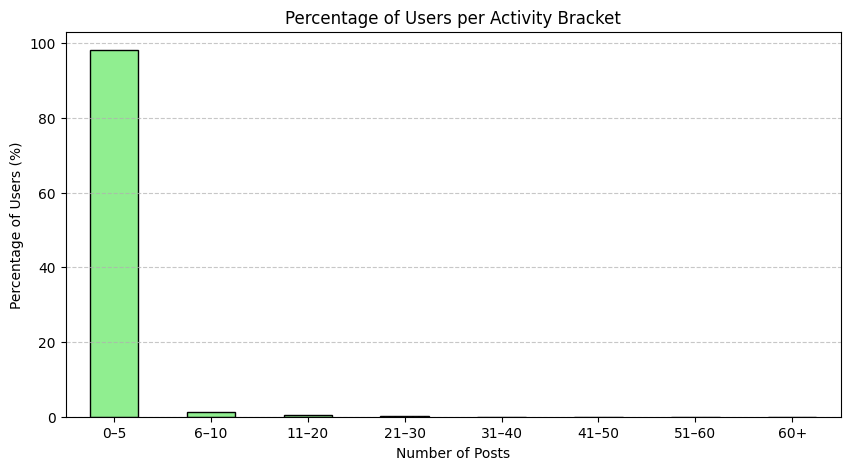

,count
Bracket,
0–5,98.176276
6–10,1.149856
11–20,0.470639
21–30,0.171141
31–40,0.021393
41–50,0.000000
51–60,0.000000
60+,0.010696


In [ ]:
# Convert to percentages
percentage_dist = (bracket_counts / bracket_counts.sum()) * 100

# Plot percentage bar chart
plt.figure(figsize=(10,5))
percentage_dist.plot(kind='bar', color='lightgreen', edgecolor='black')

plt.title("Percentage of Users per Activity Bracket")
plt.xlabel("Number of Posts")
plt.ylabel("Percentage of Users (%)")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Show percentage table
percentage_dist


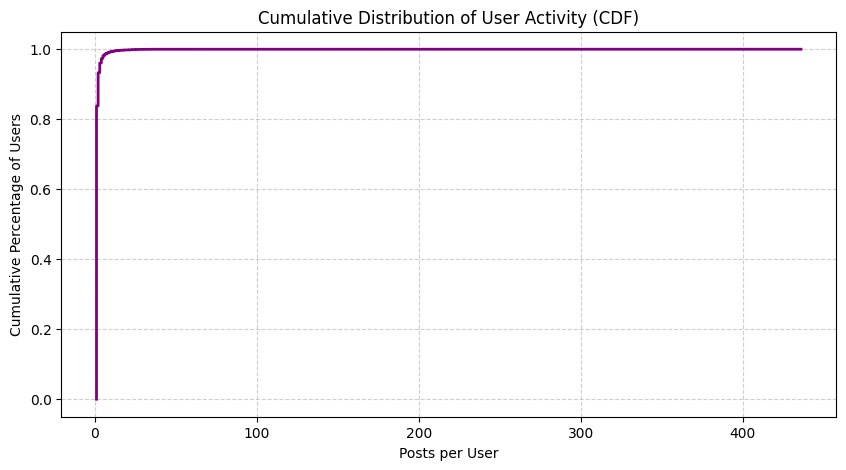

In [ ]:
# Sort post counts
sorted_counts = np.sort(user_post_counts['PostCount'])

# Compute CDF
cdf = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)

# Plot CDF
plt.figure(figsize=(10,5))
plt.plot(sorted_counts, cdf, linewidth=2, color='purple')

plt.title("Cumulative Distribution of User Activity (CDF)")
plt.xlabel("Posts per User")
plt.ylabel("Cumulative Percentage of Users")
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()


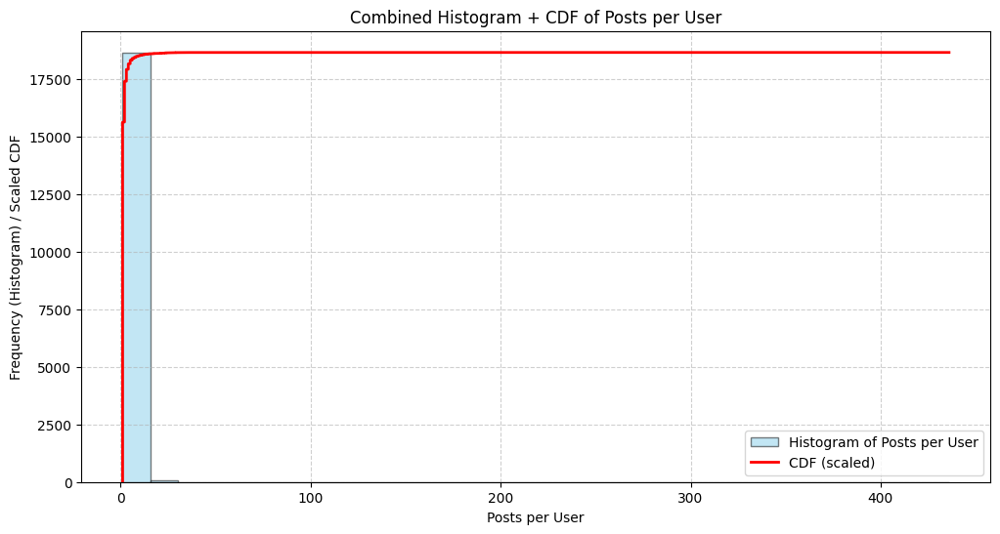

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
data = user_post_counts['PostCount']

plt.figure(figsize=(12,6))


#  Histogram

counts, bins, patches = plt.hist(
    data,
    bins=30,          # You can reduce bins if needed
    alpha=0.5,
    color='skyblue',
    edgecolor='black',
    label='Histogram of Posts per User'
)


# CDF Curve

sorted_counts = np.sort(data)
cdf = np.arange(1, len(sorted_counts) + 1) / len(sorted_counts)

plt.plot(sorted_counts, cdf * max(counts),  # scale CDF to histogram height
         color='red', linewidth=2, label='CDF (scaled)')

# Plot Formatting

plt.title("Combined Histogram + CDF of Posts per User")
plt.xlabel("Posts per User")
plt.ylabel("Frequency (Histogram) / Scaled CDF")
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()

plt.show()


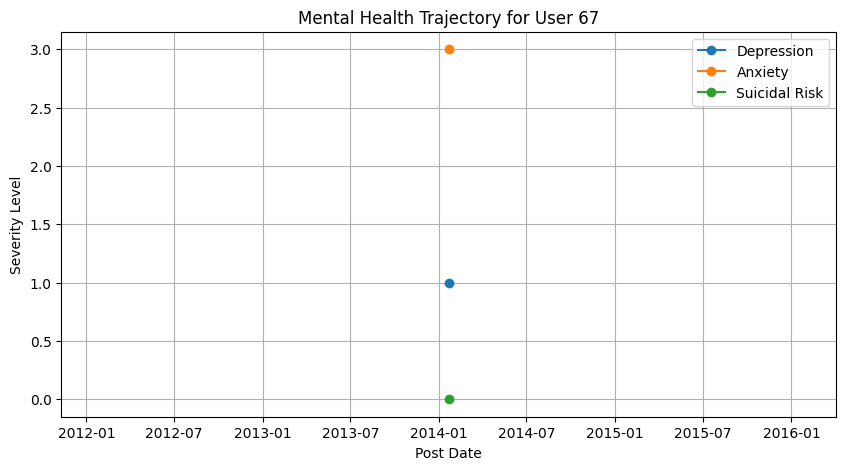

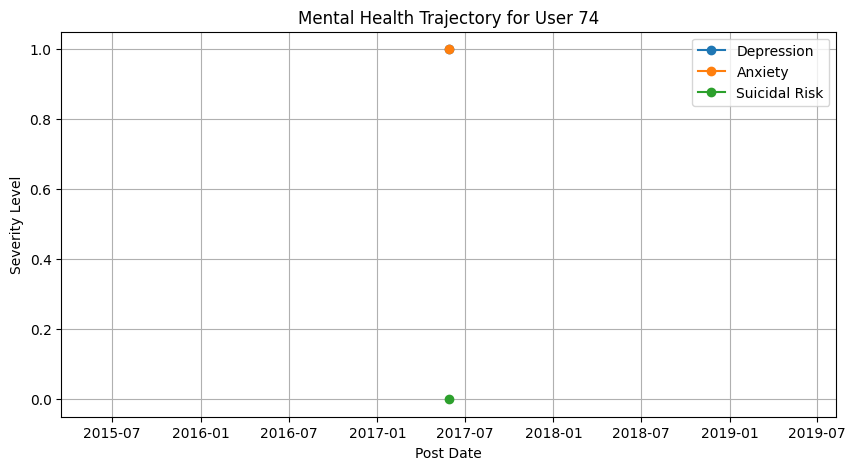

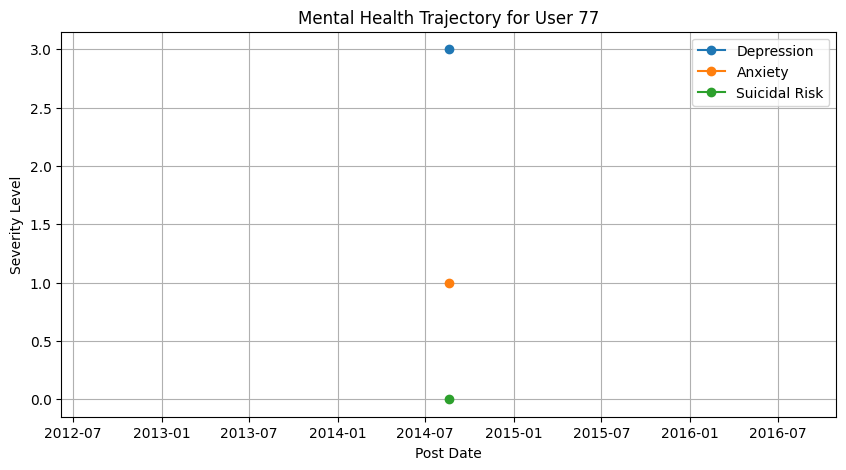

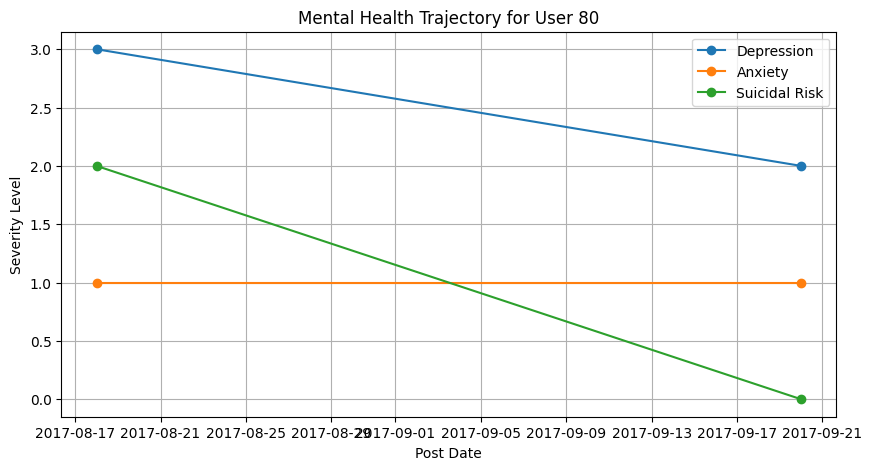

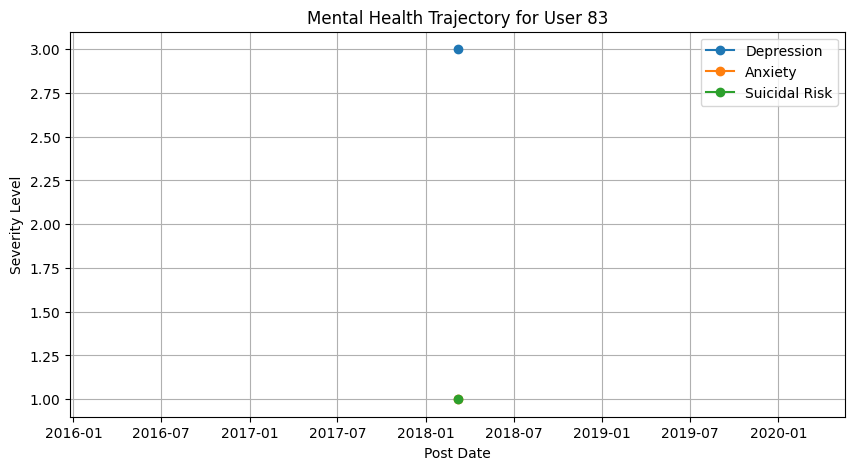

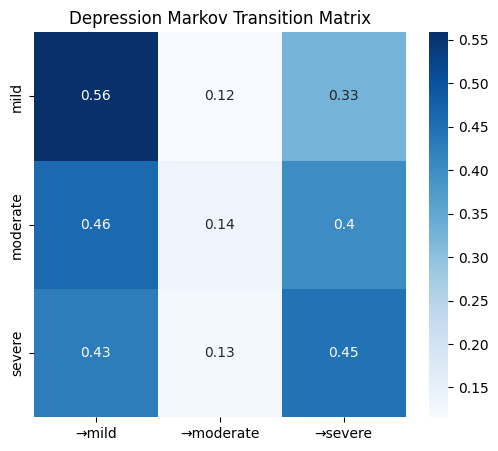

In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# 1. LOAD DATA FROM GOOGLE DRIVE

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])



# MAP LABELS TO NUMERIC (NEEDED FOR TRAJECTORIES + MARKOV)

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df['DepressionScore'] = df['Depression'].map(depression_map)
df['AnxietyScore']    = df['Anxiety'].map(anxiety_map)
df['SuicideScore']    = df['SuicidalThought'].map(suicide_map)



# TRAJECTORY MODELLING (LINE GRAPHS)

sample_users = df['UserID'].unique()[:5]   # first 5 users for report visuals

for u in sample_users:
    temp = df[df['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Mental Health Trajectory for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()
    plt.show()



# MARKOV TRANSITION MODELLING


# Markov function
def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # prevent division by zero
    matrix = matrix / row_sums

    return matrix



# Depression Markov Matrix

dep_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_dep = build_transition_matrix([t[0] for t in dep_transitions], 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Depression_Markov_Transitions.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Transition Matrix")
plt.show()



# Anxiety Markov Matrix

anx_transitions = []
for uid, group in df.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_anx = build_transition_matrix([t[0] for t in anx_transitions], 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)


In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# LOAD DATA FROM DRIVE

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])



# 2. IDENTIFY TOP 5 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top5_users = user_post_counts.sort_values("PostCount", ascending=False).head(5)['UserID']
print("Top 5 Users:", top5_users.tolist())

# Filter df for only these 5 users
df_top5 = df[df['UserID'].isin(top5_users)]



# MAP LABELS TO NUMERIC

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
df_top5['AnxietyScore']    = df_top5['An]()


SyntaxError: unterminated string literal (detected at line 46) (ipython-input-3842736010.py, line 46)

Top 5 Users: [19707, 17566, 17509, 40416, 33966]


/tmp/ipython-input-1976613756.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
/tmp/ipython-input-1976613756.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top5['AnxietyScore']    = df_top5['Anxiety'].map(anxiety_map)
/tmp/ipython-input-1976613756.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

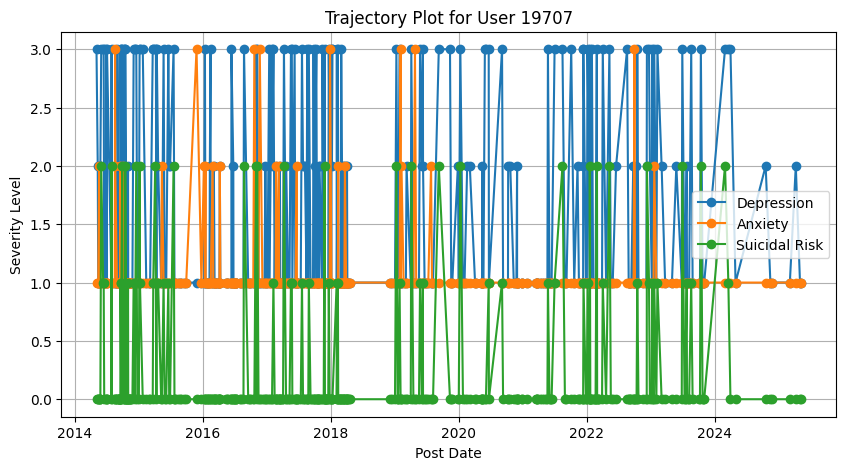

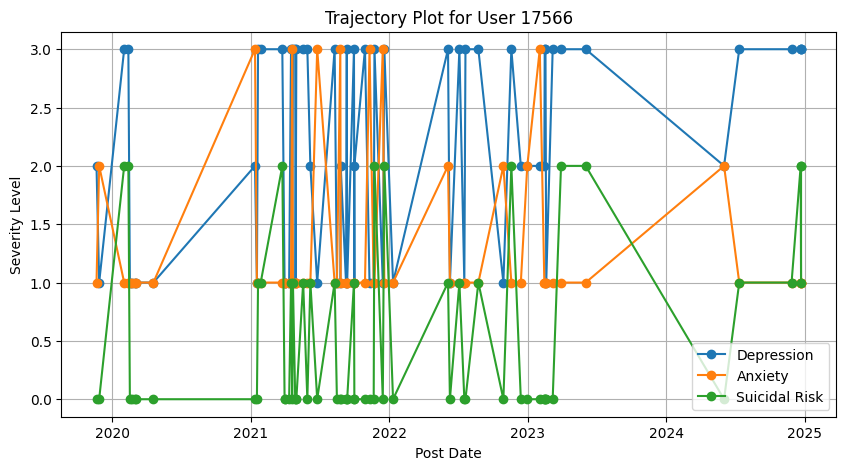

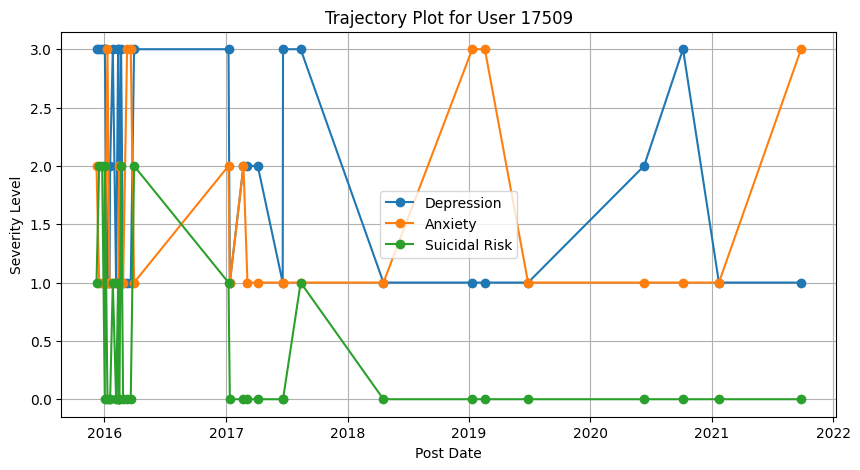

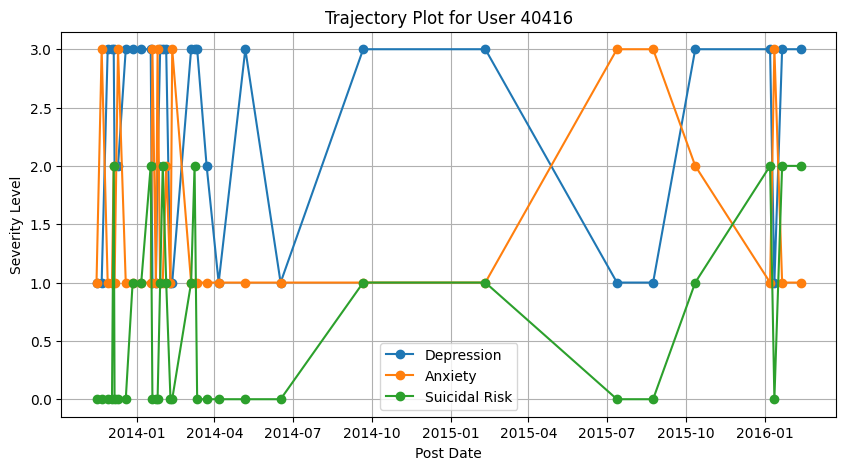

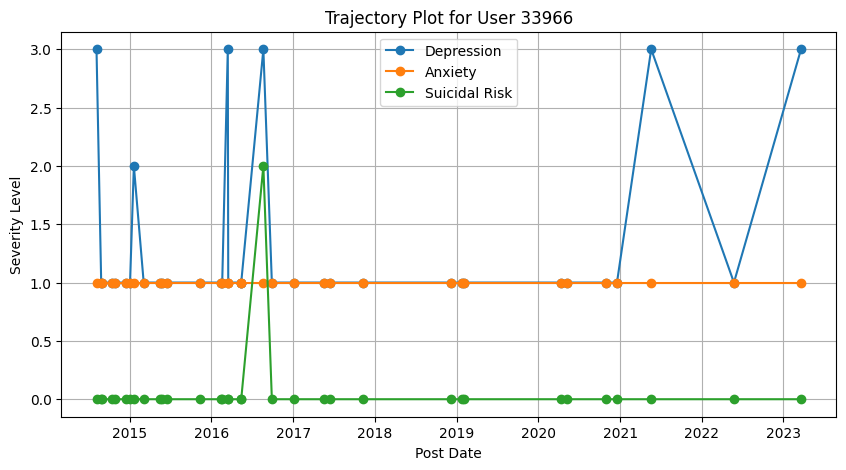

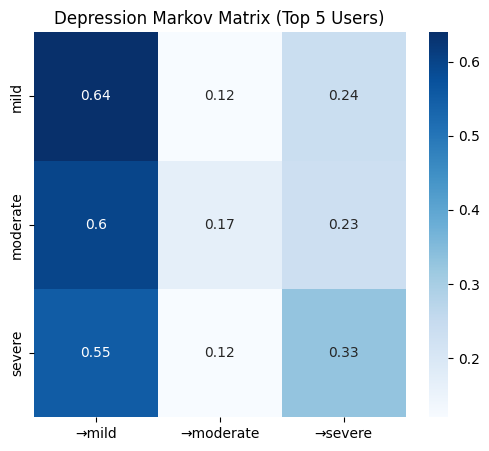

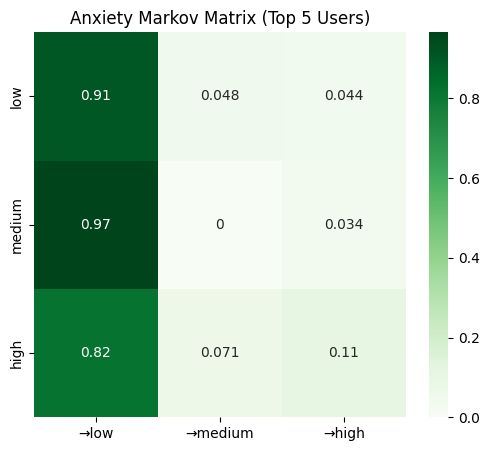

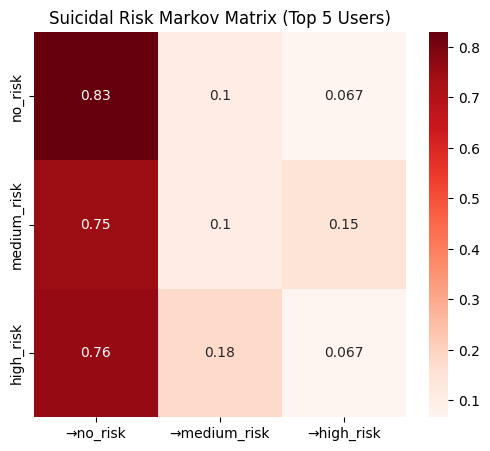

Trajectory + Markov modelling completed for top 5 users.


In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# LOAD DATA FROM  DRIVE

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])



# IDENTIFY TOP 5 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top5_users = user_post_counts.sort_values("PostCount", ascending=False).head(5)['UserID']
print("Top 5 Users:", top5_users.tolist())

# Filter df for only these 5 users
df_top5 = df[df['UserID'].isin(top5_users)]



# MAP LABELS TO NUMERIC

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top5['DepressionScore'] = df_top5['Depression'].map(depression_map)
df_top5['AnxietyScore']    = df_top5['Anxiety'].map(anxiety_map)
df_top5['SuicideScore']    = df_top5['SuicidalThought'].map(suicide_map)



# TRAJECTORY PLOTS (TOP 5 USERS)

for u in top5_users:
    temp = df_top5[df_top5['UserID'] == u]

    plt.figure(figsize=(10,5))
    plt.plot(temp['PostDate'], temp['DepressionScore'], marker='o', label="Depression")
    plt.plot(temp['PostDate'], temp['AnxietyScore'], marker='o', label="Anxiety")
    plt.plot(temp['PostDate'], temp['SuicideScore'], marker='o', label="Suicidal Risk")

    plt.title(f"Trajectory Plot for User {u}")
    plt.xlabel("Post Date")
    plt.ylabel("Severity Level")
    plt.grid(True)
    plt.legend()
    plt.show()




# MARKOV TRANSITION MODELLING (TOP 5 USERS)


def build_transition_matrix(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1  # avoid divide by zero
    matrix = matrix / row_sums

    return matrix



# Depression Markov Matrix (Top 5 users)

dep_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['DepressionScore'].tolist()
    if len(seq) > 1:
        dep_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_dep = build_transition_matrix([t[0] for t in dep_transitions], 4)

df_dep_mat = pd.DataFrame(
    matrix_dep[1:4, 1:4],
    index=['mild','moderate','severe'],
    columns=['→mild','→moderate','→severe']
)

df_dep_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_Depression_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_dep_mat, annot=True, cmap="Blues")
plt.title("Depression Markov Matrix (Top 5 Users)")
plt.show()


 Anxiety Markov Matrix (Top 5 uders)

anx_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['AnxietyScore'].tolist()
    if len(seq) > 1:
        anx_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_anx = build_transition_matrix([t[0] for t in anx_transitions], 4)

df_anx_mat = pd.DataFrame(
    matrix_anx[1:4, 1:4],
    index=['low','medium','high'],
    columns=['→low','→medium','→high']
)

df_anx_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_Anxiety_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_anx_mat, annot=True, cmap="Greens")
plt.title("Anxiety Markov Matrix (Top 5 Users)")
plt.show()



# Suicidal Risk Markov Matrix

sui_transitions = []
for uid, group in df_top5.groupby("UserID"):
    seq = group['SuicideScore'].tolist()
    if len(seq) > 1:
        sui_transitions.extend(list(zip(seq[:-1], seq[1:])))

matrix_sui = build_transition_matrix([t[0] for t in sui_transitions], 3)

df_sui_mat = pd.DataFrame(
    matrix_sui,
    index=['no_risk','medium_risk','high_risk'],
    columns=['→no_risk','→medium_risk','→high_risk']
)

df_sui_mat.to_csv("/content/drive/MyDrive/Project_N/Top5_SuicidalRisk_Markov.csv")

plt.figure(figsize=(6,5))
sns.heatmap(df_sui_mat, annot=True, cmap="Reds")
plt.title("Suicidal Risk Markov Matrix (Top 5 Users)")
plt.show()

print("Trajectory + Markov modelling completed for top 5 users.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]


/tmp/ipython-input-977289787.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-977289787.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-977289787.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

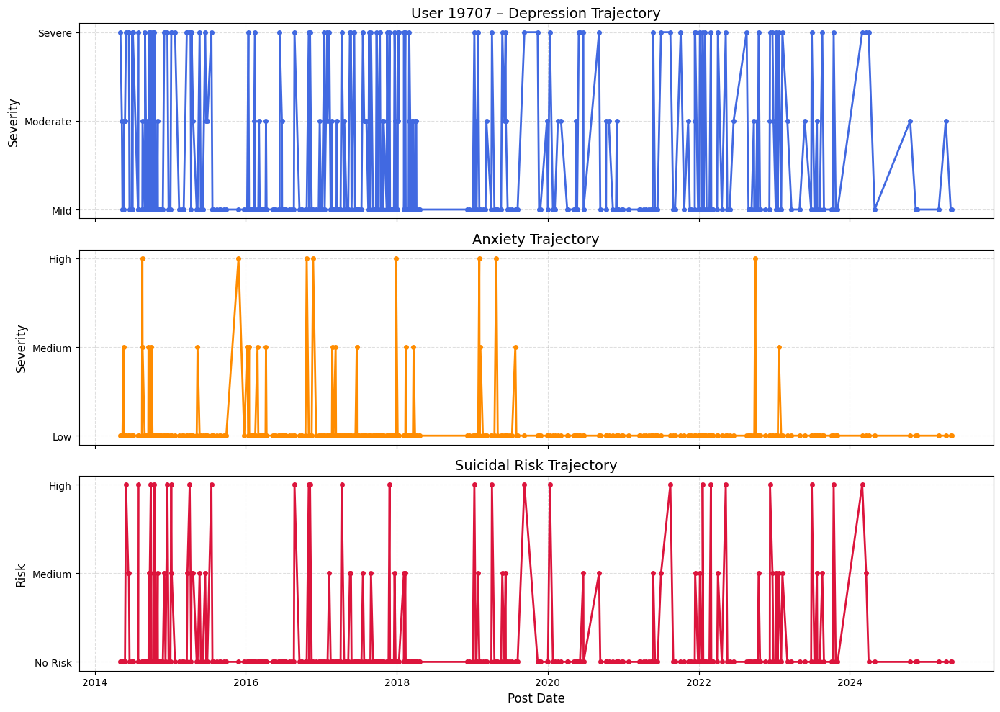

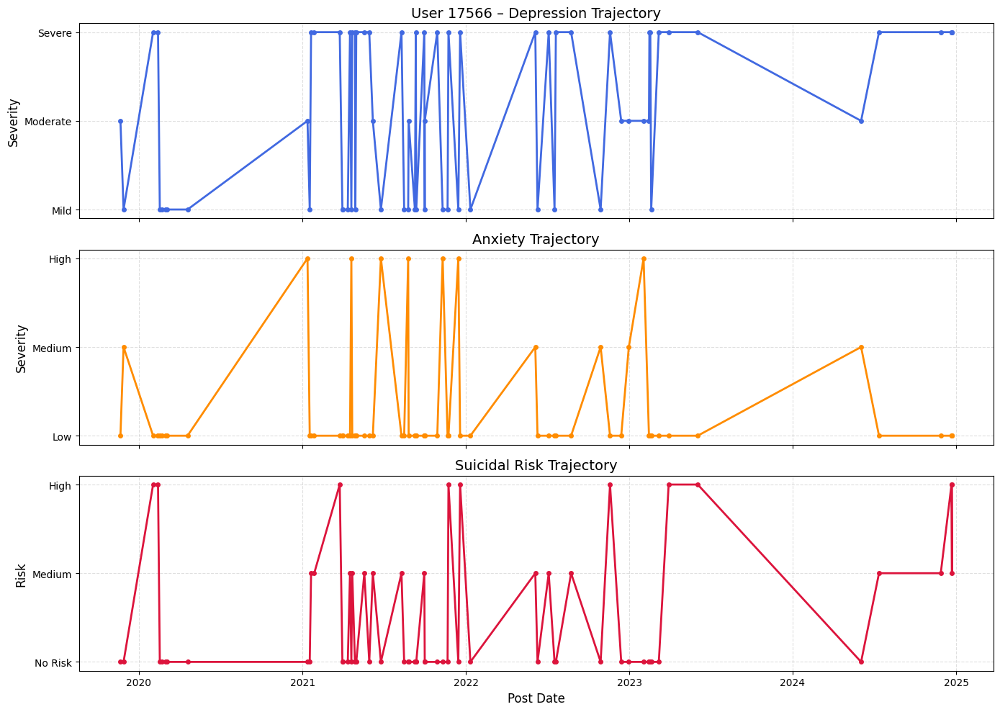

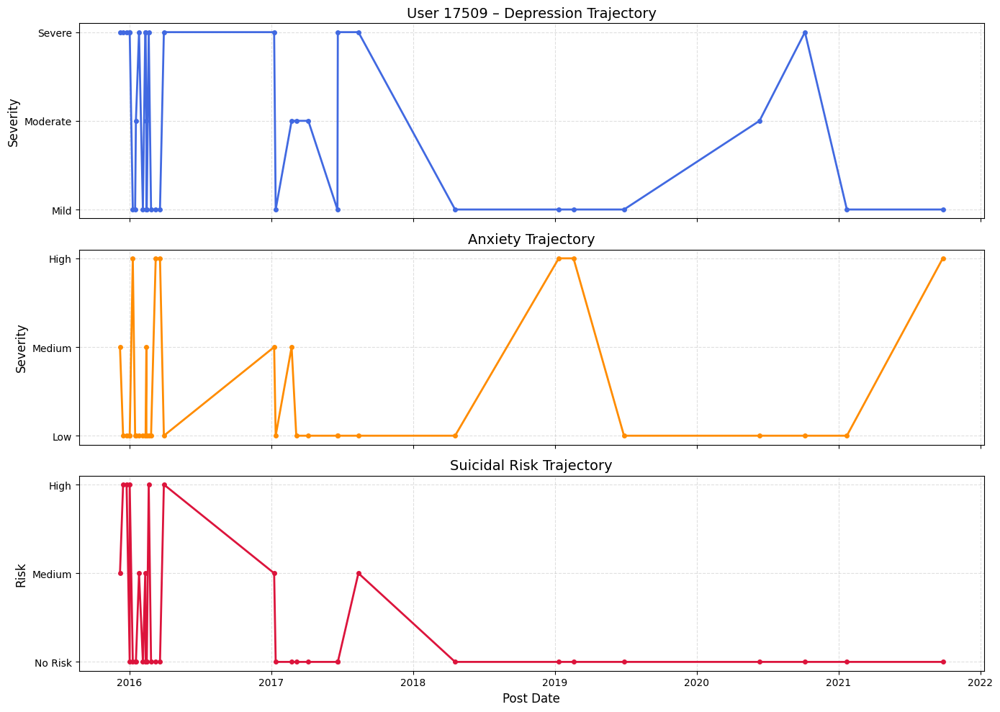

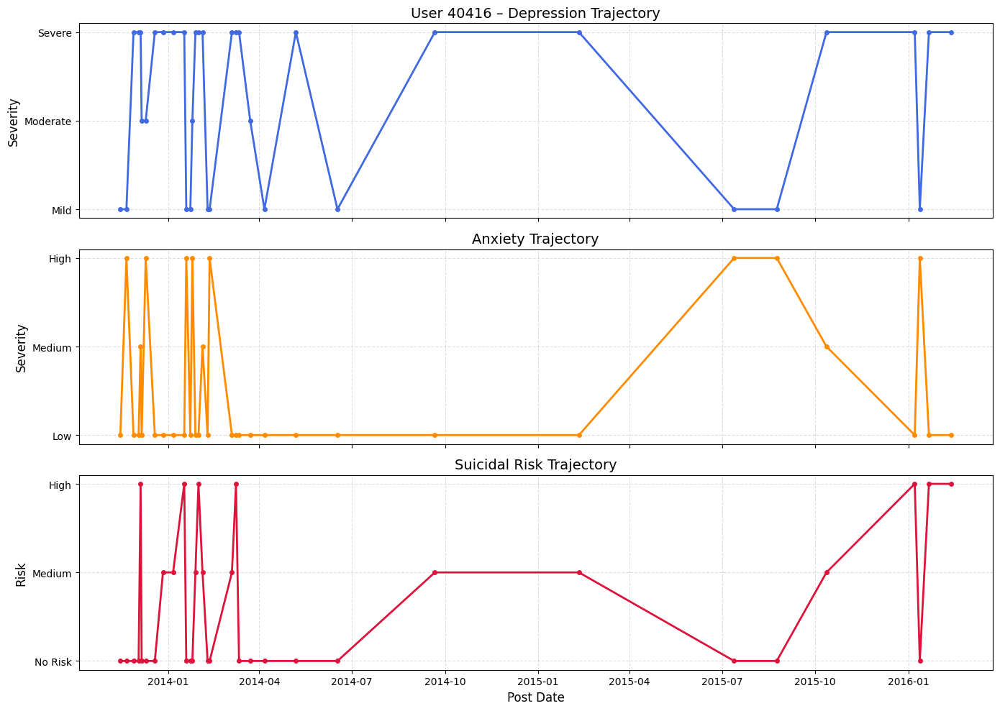

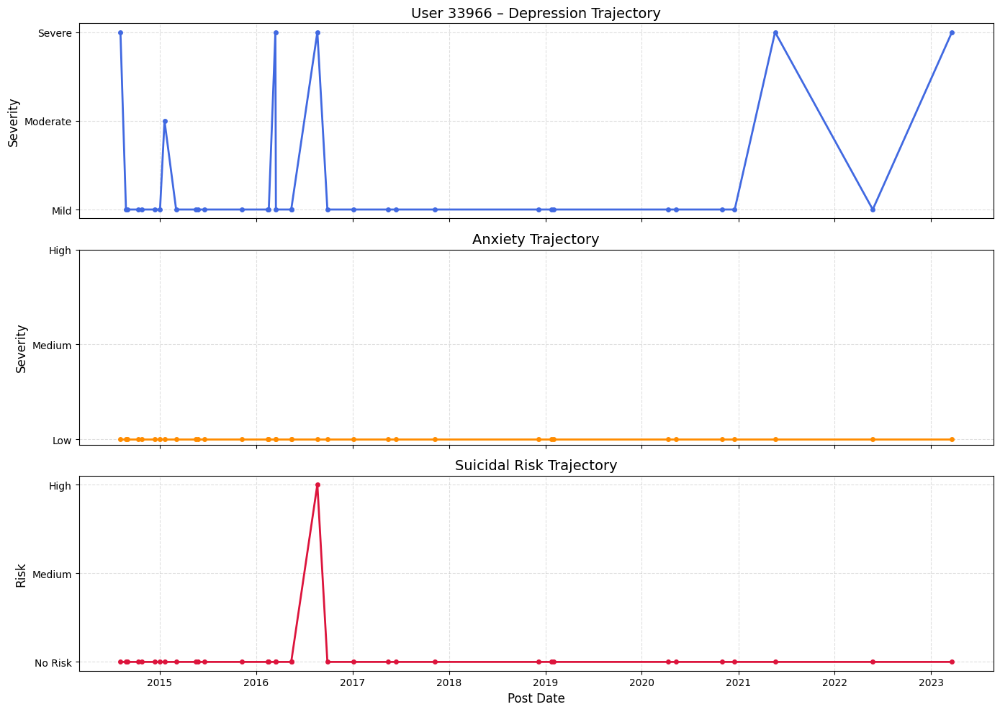

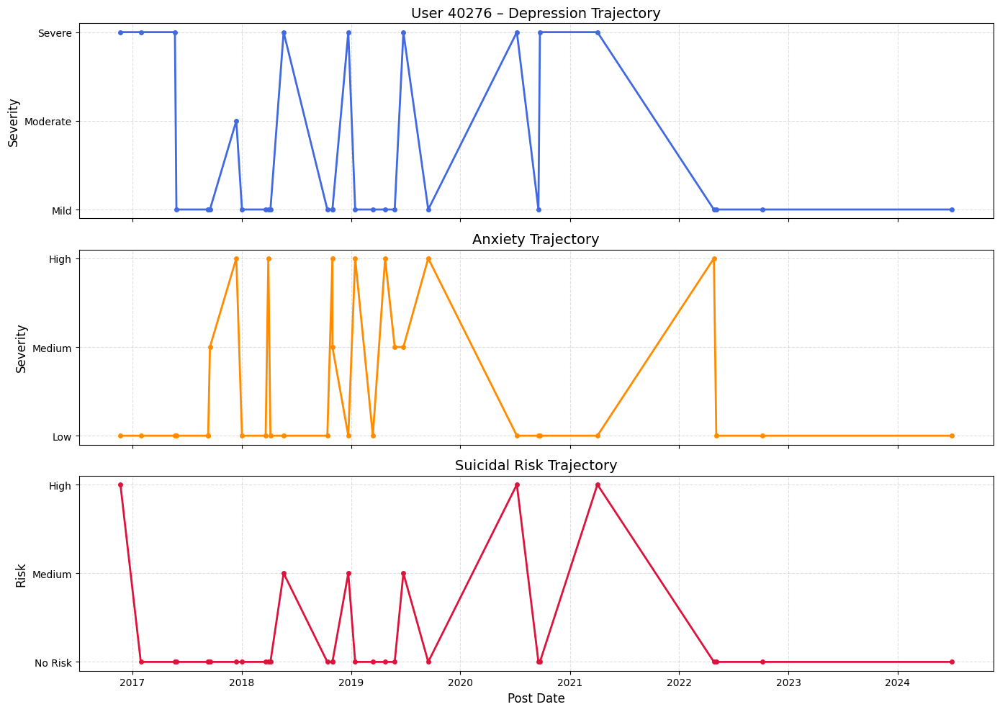

In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# LOAD DATA FROM GOOGLE DRIVE

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])

# IDENTIFY TOP 6 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

# Filter only these users
df_top6 = df[df['UserID'].isin(top6_users)]


#  MAP LABELS TO NUMERIC SCORES

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)


# 4.TRAJECTORY PLOTS

for u in top6_users:
    temp = df_top6[df_top6['UserID'] == u].copy()

    fig, axes = plt.subplots(3, 1, figsize=(14,10), sharex=True)

    # Depression
    axes[0].plot(temp['PostDate'], temp['DepressionScore'], marker='o',
                 color='royalblue', linewidth=2, markersize=4)
    axes[0].set_title(f"User {u} – Depression Trajectory", fontsize=14)
    axes[0].set_ylabel("Severity", fontsize=12)
    axes[0].grid(True, linestyle='--', alpha=0.4)
    axes[0].set_yticks([1,2,3])
    axes[0].set_yticklabels(['Mild','Moderate','Severe'])

    # Anxiety
    axes[1].plot(temp['PostDate'], temp['AnxietyScore'], marker='o',
                 color='darkorange', linewidth=2, markersize=4)
    axes[1].set_title("Anxiety Trajectory", fontsize=14)
    axes[1].set_ylabel("Severity", fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.4)
    axes[1].set_yticks([1,2,3])
    axes[1].set_yticklabels(['Low','Medium','High'])

    #  Suicidal Risk
    axes[2].plot(temp['PostDate'], temp['SuicideScore'], marker='o',
                 color='crimson', linewidth=2, markersize=4)
    axes[2].set_title("Suicidal Risk Trajectory", fontsize=14)
    axes[2].set_ylabel("Risk", fontsize=12)
    axes[2].grid(True, linestyle='--', alpha=0.4)
    axes[2].set_yticks([0,1,2])
    axes[2].set_yticklabels(['No Risk','Medium','High'])
    axes[2].set_xlabel("Post Date", fontsize=12)

    plt.tight_layout()
    plt.show()


#### PNG for trend

Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]


/tmp/ipython-input-3088514468.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-3088514468.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-3088514468.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

Saved PNG: /content/drive/MyDrive/Project_N/User_19707_Trajectory.png


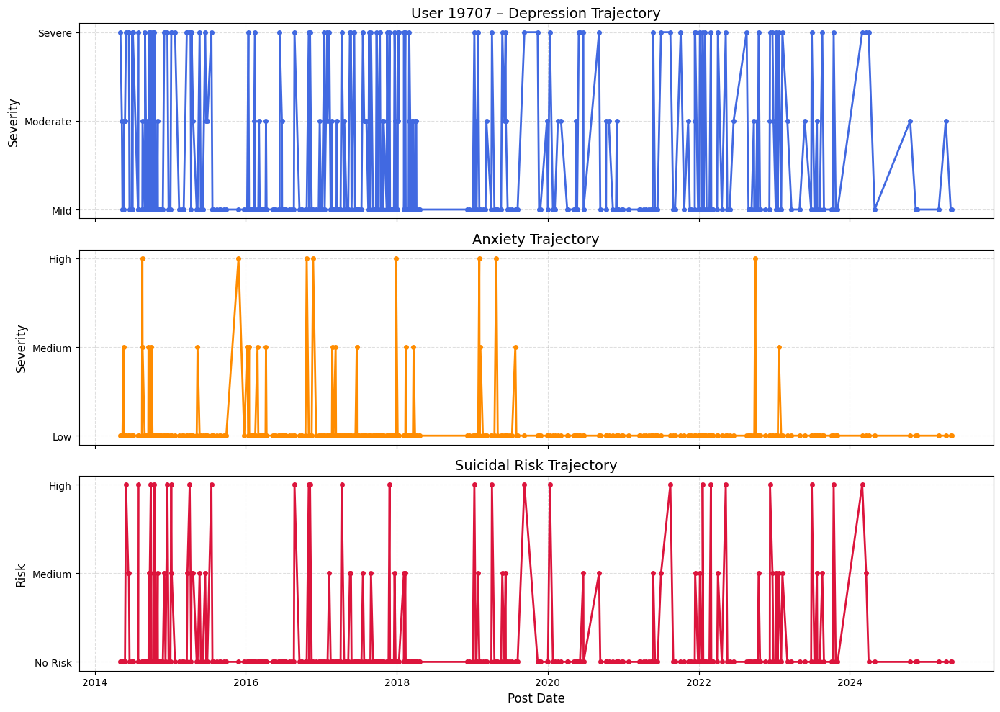

Saved PNG: /content/drive/MyDrive/Project_N/User_17566_Trajectory.png


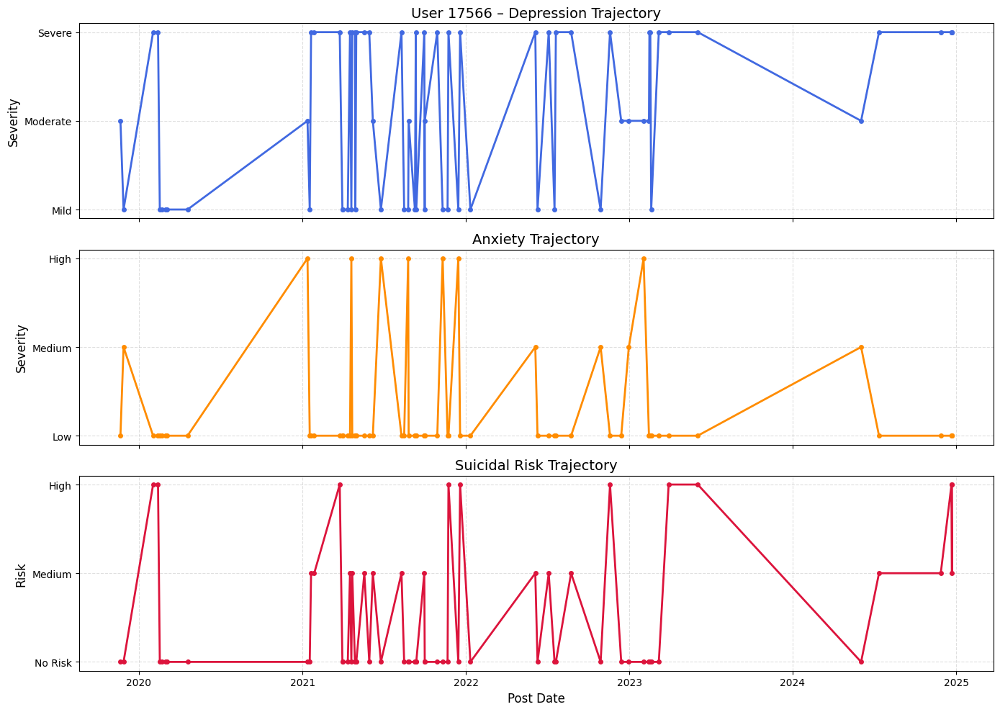

Saved PNG: /content/drive/MyDrive/Project_N/User_17509_Trajectory.png


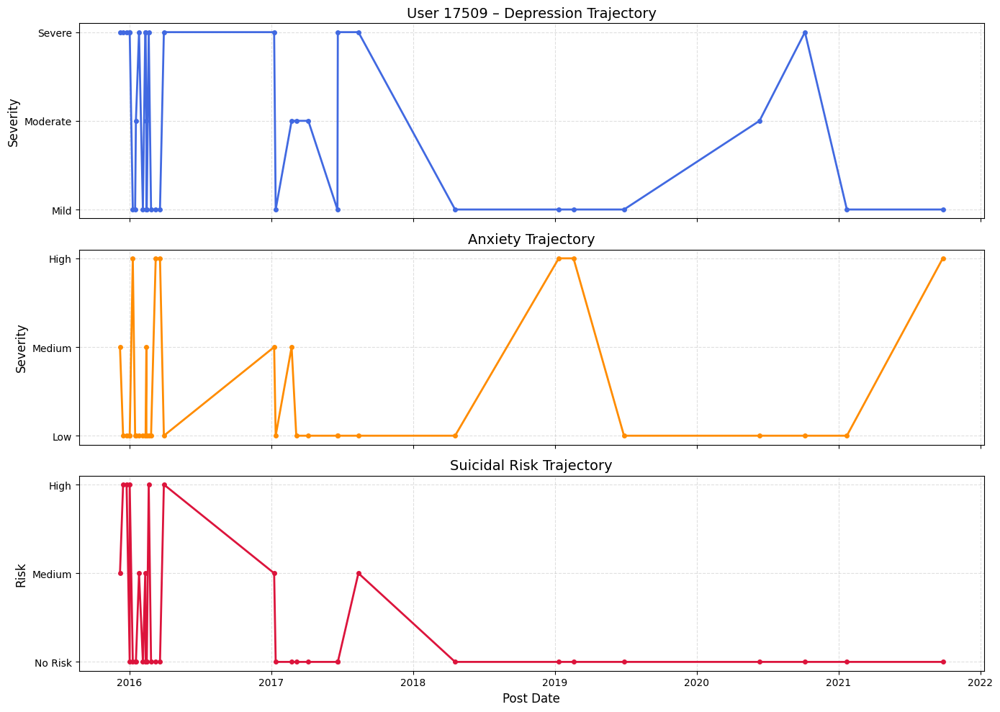

Saved PNG: /content/drive/MyDrive/Project_N/User_40416_Trajectory.png


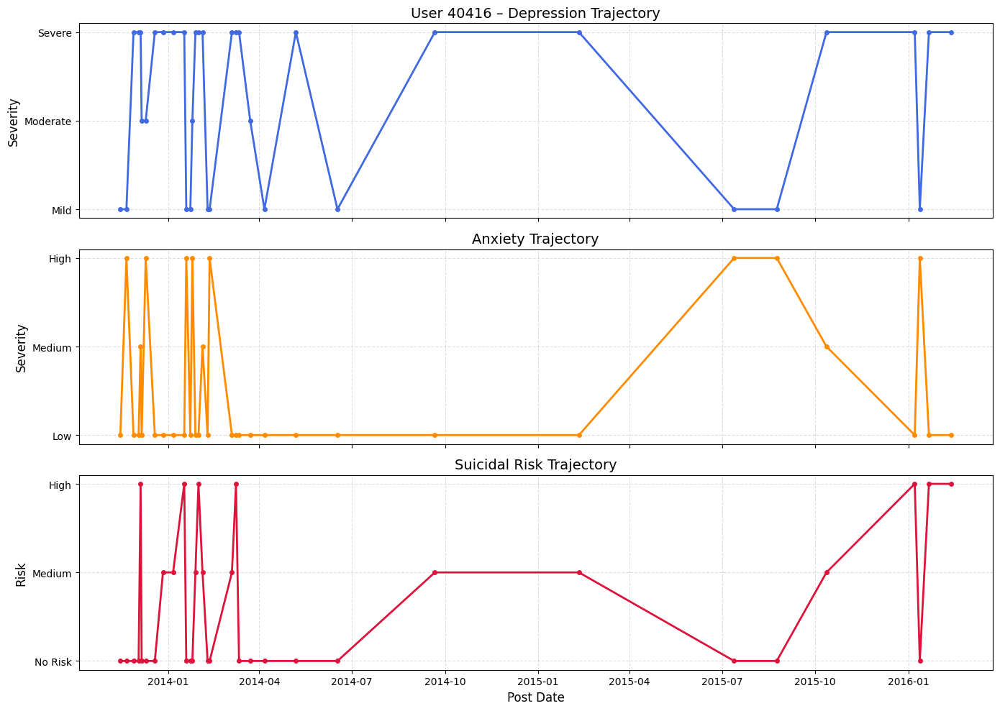

Saved PNG: /content/drive/MyDrive/Project_N/User_33966_Trajectory.png


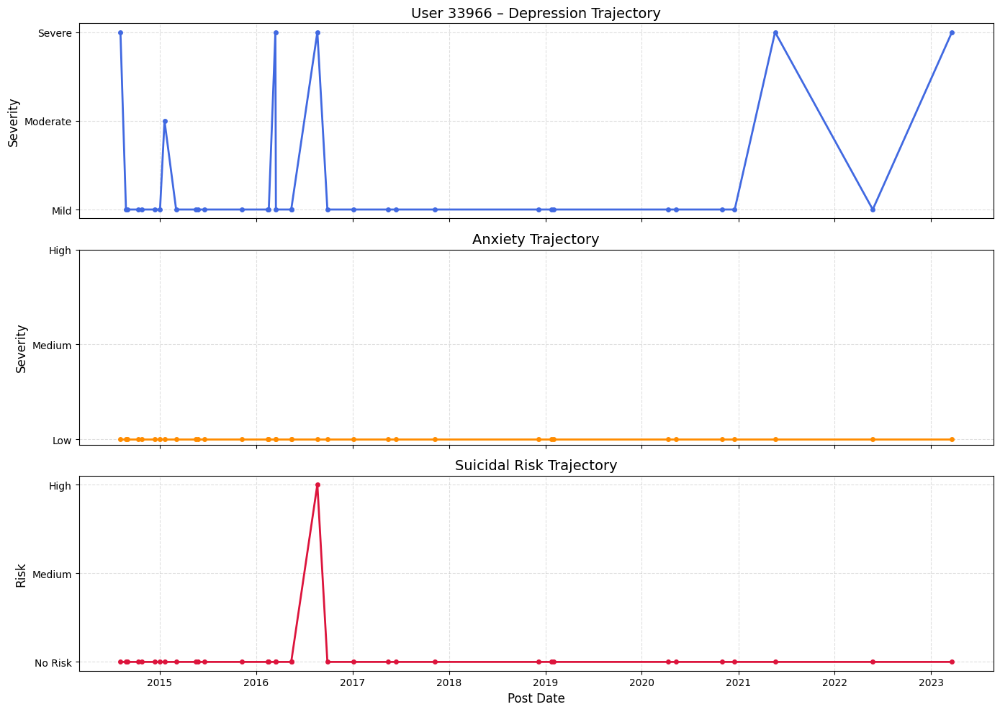

Saved PNG: /content/drive/MyDrive/Project_N/User_40276_Trajectory.png


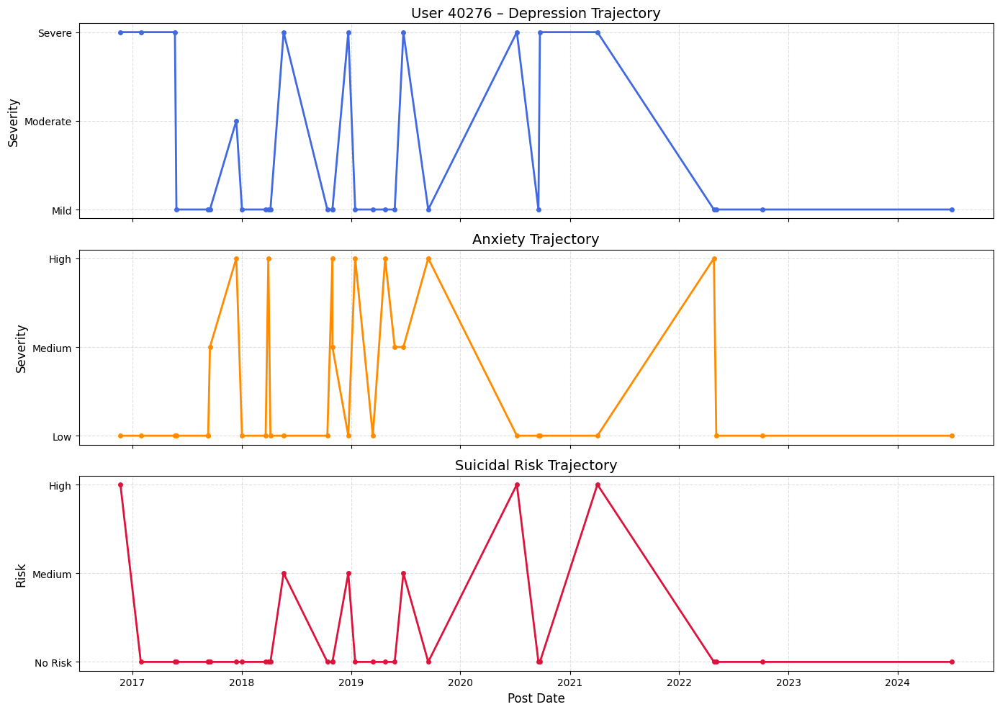

In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os


# 1. LOAD DATA

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])

#  IDENTIFY TOP 6 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

# Filter only these users
df_top6 = df[df['UserID'].isin(top6_users)]


# MAP LABELS TO NUMERIC SCORES

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)


# SAVE PNG OUTPUT LOCATION

output_dir = "/content/drive/MyDrive/Project_N/"
os.makedirs(output_dir, exist_ok=True)


# TRAJECTORY PLOTS FOR TOP 6 USERS (SAVE PNG)

for u in top6_users:
    temp = df_top6[df_top6['UserID'] == u].copy()

    fig, axes = plt.subplots(3, 1, figsize=(14,10), sharex=True)

    #Depression
    axes[0].plot(temp['PostDate'], temp['DepressionScore'], marker='o',
                 color='royalblue', linewidth=2, markersize=4)
    axes[0].set_title(f"User {u} – Depression Trajectory", fontsize=14)
    axes[0].set_ylabel("Severity", fontsize=12)
    axes[0].grid(True, linestyle='--', alpha=0.4)
    axes[0].set_yticks([1,2,3])
    axes[0].set_yticklabels(['Mild','Moderate','Severe'])

    #  Anxiety
    axes[1].plot(temp['PostDate'], temp['AnxietyScore'], marker='o',
                 color='darkorange', linewidth=2, markersize=4)
    axes[1].set_title("Anxiety Trajectory", fontsize=14)
    axes[1].set_ylabel("Severity", fontsize=12)
    axes[1].grid(True, linestyle='--', alpha=0.4)
    axes[1].set_yticks([1,2,3])
    axes[1].set_yticklabels(['Low','Medium','High'])

    # Suicidal Risk
    axes[2].plot(temp['PostDate'], temp['SuicideScore'], marker='o',
                 color='crimson', linewidth=2, markersize=4)
    axes[2].set_title("Suicidal Risk Trajectory", fontsize=14)
    axes[2].set_ylabel("Risk", fontsize=12)
    axes[2].grid(True, linestyle='--', alpha=0.4)
    axes[2].set_yticks([0,1,2])
    axes[2].set_yticklabels(['No Risk','Medium','High'])
    axes[2].set_xlabel("Post Date", fontsize=12)

    plt.tight_layout()

    # SAVE PNG
    save_path = f"{output_dir}User_{u}_Trajectory.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print("Saved PNG:", save_path)

    plt.show()


In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. LOAD DATA

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])



# IDENTIFY TOP 6 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

df_top6 = df[df['UserID'].isin(top6_users)]



# MAP LABELS TO NUMERIC

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)



# FUNCTION: PER-USER TRANSITION PROBABILITY MATRIX


def user_transition_probabilities(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # safe divide
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix



# CALCULATE TRANSITIONS FOR EACH OF THE TOP 6 USERS

user_dep_prob = {}
user_anx_prob = {}
user_sui_prob = {}

for uid in top6_users:
    temp = df_top6[df_top6['UserID'] == uid]

    dep_seq = temp['DepressionScore'].tolist()
    anx_seq = temp['AnxietyScore'].tolist()
    sui_seq = temp['SuicideScore'].tolist()

    user_dep_prob[uid] = user_transition_probabilities(dep_seq, 4)
    user_anx_prob[uid] = user_transition_probabilities(anx_seq, 4)
    user_sui_prob[uid] = user_transition_probabilities(sui_seq, 3)



# PRINT TRANSITION MATRICES CLEARLY FOR EACH USER


print("\n================ DEPRESSION TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4],
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    )
    print(mat)


print("\n================ ANXIETY TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4],
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    )
    print(mat)


print("\n================ SUICIDAL RISK TRANSITION PROBABILITIES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_sui_prob[uid],
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    )
    print(mat)


print("\n\nAll per-user transition probabilities successfully generated.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]

================ DEPRESSION TRANSITION PROBABILITIES ================


----- User 19707 -----
             →mild  →moderate   →severe
mild      0.670139   0.125000  0.204861
moderate  0.678571   0.125000  0.196429
severe    0.637363   0.142857  0.219780

----- User 17566 -----
             →mild  →moderate   →severe
mild      0.307692   0.115385  0.576923
moderate  0.400000   0.300000  0.300000
severe    0.451613   0.096774  0.451613

----- User 17509 -----
             →mild  →moderate   →severe
mild      0.533333   0.200000  0.266667
moderate  0.333333   0.333333  0.333333
severe    0.428571   0.071429  0.500000

----- User 40416 -----
             →mild  →moderate   →severe
mild      0.363636   0.090909  0.545455
moderate  0.250000   0.250000  0.500000
severe    0.263158   0.105263  0.631579

----- User 33966 -----
             →mild  →moderate   →severe
mild      0.827586   0.034483  0.137931
moderate  1.000000   0.000000  0

/tmp/ipython-input-1906380362.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-1906380362.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-1906380362.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [ ]:

# LOAD LIBRARIES

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


#  LOAD DATA FROM GOOGLE DRIVE

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# Fix column names
df = df.rename(columns={
    'User ID': 'UserID',
    'Post Date': 'PostDate'
})

df['PostDate'] = pd.to_datetime(df['PostDate'], errors='coerce')
df = df.sort_values(['UserID', 'PostDate'])



#  IDENTIFY TOP 6 MOST ACTIVE USERS

user_post_counts = df.groupby("UserID")["Post ID"].count().reset_index()
user_post_counts = user_post_counts.rename(columns={'Post ID': 'PostCount'})

top6_users = user_post_counts.sort_values("PostCount", ascending=False).head(6)['UserID']
print("Top 6 Users:", top6_users.tolist())

df_top6 = df[df['UserID'].isin(top6_users)]



# MAP LABELS TO NUMERIC

depression_map = {'mild':1, 'moderate':2, 'severe':3}
anxiety_map    = {'low':1, 'medium':2, 'high':3}
suicide_map    = {'no_risk':0, 'medium_risk':1, 'high_risk':2}

df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
df_top6['SuicideScore']    = df_top6['SuicidalThought'].map(suicide_map)



# FUNCTION: PER-USER TRANSITION PROBABILITY MATRIX


def user_transition_probabilities(sequence, num_states):
    matrix = np.zeros((num_states, num_states))

    for i in range(len(sequence)-1):
        current = sequence[i]
        nxt = sequence[i+1]
        matrix[current][nxt] += 1

    # safe divide
    row_sums = matrix.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    matrix = matrix / row_sums

    return matrix



# CALCULATE TRANSITIONS FOR EACH OF THE TOP 6 USERS


user_dep_prob = {}
user_anx_prob = {}
user_sui_prob = {}

for uid in top6_users:
    temp = df_top6[df_top6['UserID'] == uid]

    dep_seq = temp['DepressionScore'].tolist()
    anx_seq = temp['AnxietyScore'].tolist()
    sui_seq = temp['SuicideScore'].tolist()

    user_dep_prob[uid] = user_transition_probabilities(dep_seq, 4)
    user_anx_prob[uid] = user_transition_probabilities(anx_seq, 4)
    user_sui_prob[uid] = user_transition_probabilities(sui_seq, 3)



#  PRINT TRANSITION MATRICES AS PERCENTAGES (%)


print("\n================ DEPRESSION TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4] * 100,
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    ).round(2)
    print(mat)


print("\n================ ANXIETY TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4] * 100,
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    ).round(2)
    print(mat)


print("\n================ SUICIDAL RISK TRANSITION PERCENTAGES ================\n")
for uid in top6_users:
    print(f"\n----- User {uid} -----")
    mat = pd.DataFrame(
        user_sui_prob[uid] * 100,
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    ).round(2)
    print(mat)


print("\n\nAll per-user transition percentage matrices successfully generated.")


Top 6 Users: [19707, 17566, 17509, 40416, 33966, 40276]

================ DEPRESSION TRANSITION PERCENTAGES ================


----- User 19707 -----
          →mild  →moderate  →severe
mild      67.01      12.50    20.49
moderate  67.86      12.50    19.64
severe    63.74      14.29    21.98

----- User 17566 -----
          →mild  →moderate  →severe
mild      30.77      11.54    57.69
moderate  40.00      30.00    30.00
severe    45.16       9.68    45.16

----- User 17509 -----
          →mild  →moderate  →severe
mild      53.33      20.00    26.67
moderate  33.33      33.33    33.33
severe    42.86       7.14    50.00

----- User 40416 -----
          →mild  →moderate  →severe
mild      36.36       9.09    54.55
moderate  25.00      25.00    50.00
severe    26.32      10.53    63.16

----- User 33966 -----
           →mild  →moderate  →severe
mild       82.76       3.45    13.79
moderate  100.00       0.00     0.00
severe    100.00       0.00     0.00

----- User 40276 -----
      

/tmp/ipython-input-127012455.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['DepressionScore'] = df_top6['Depression'].map(depression_map)
/tmp/ipython-input-127012455.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top6['AnxietyScore']    = df_top6['Anxiety'].map(anxiety_map)
/tmp/ipython-input-127012455.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


====== DEPRESSION TRANSITION HEATMAPS ======



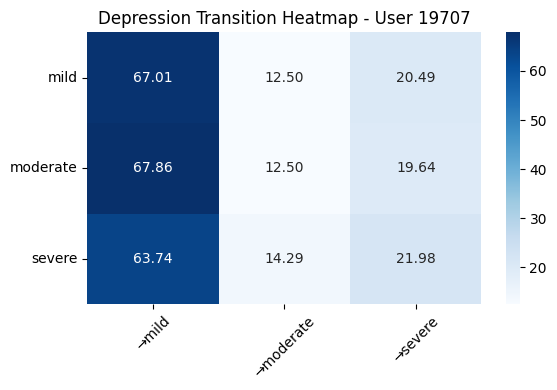

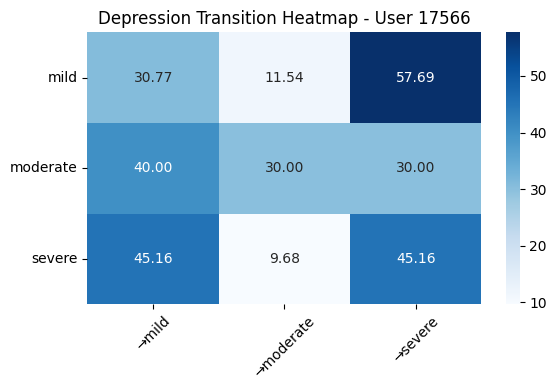

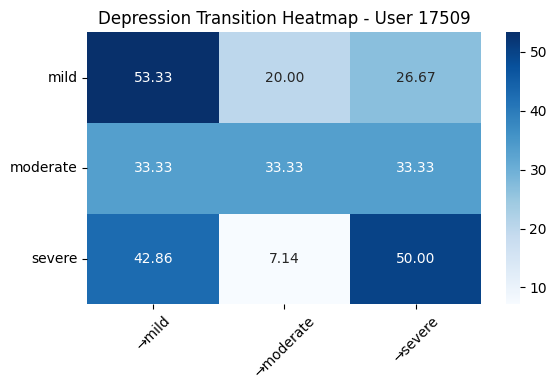

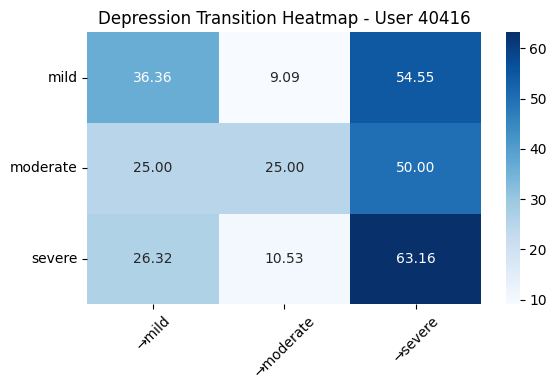

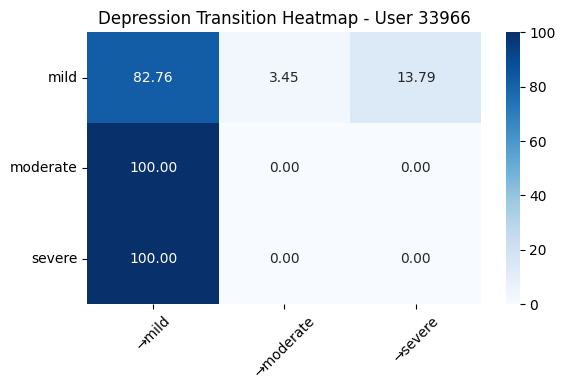

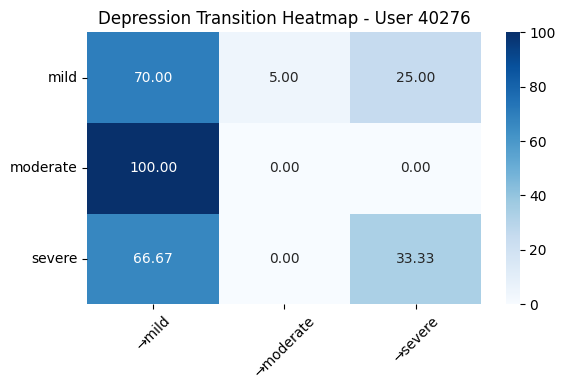


====== ANXIETY TRANSITION HEATMAPS ======



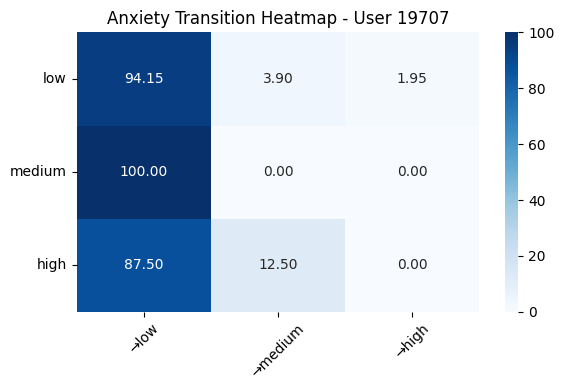

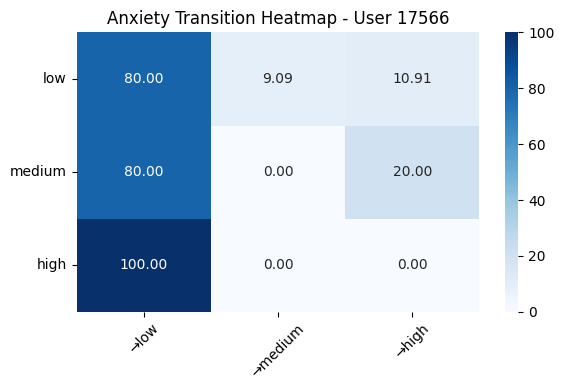

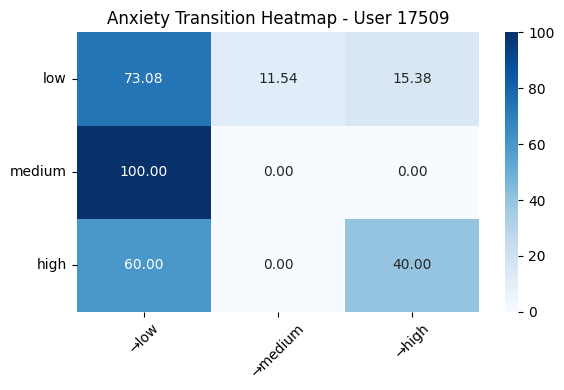

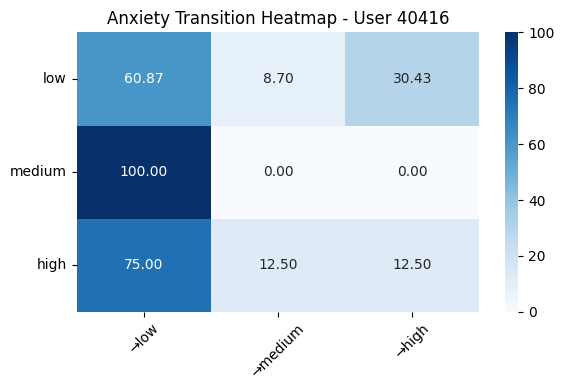

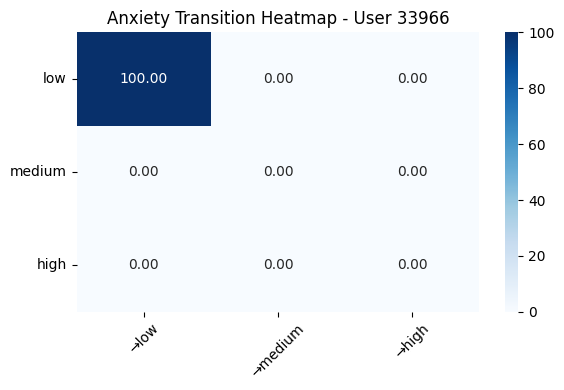

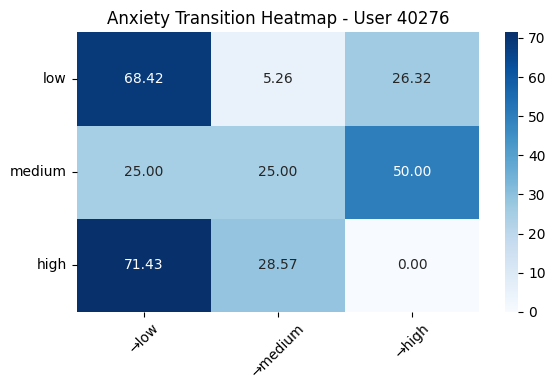


====== SUICIDAL RISK TRANSITION HEATMAPS ======



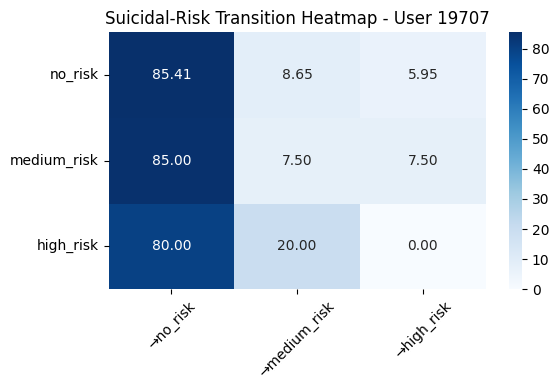

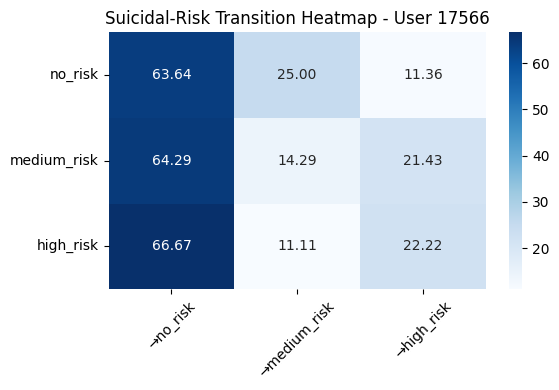

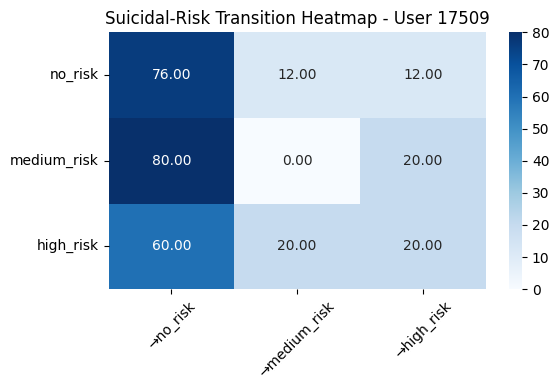

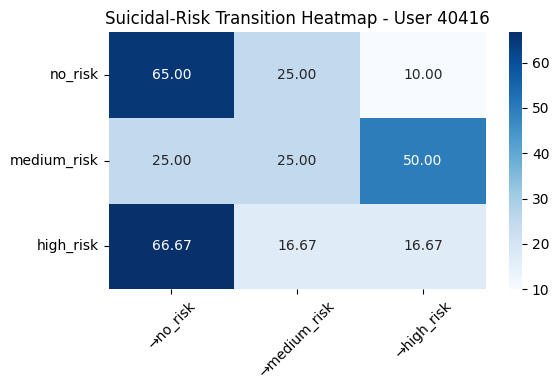

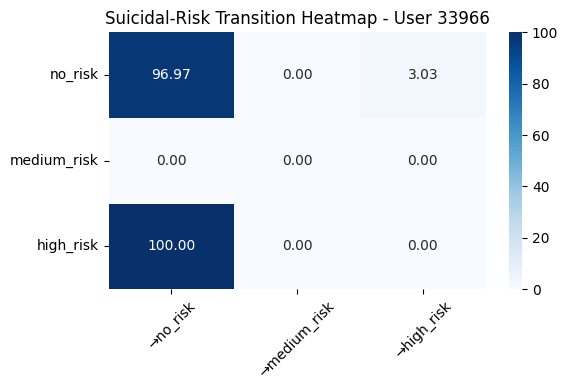

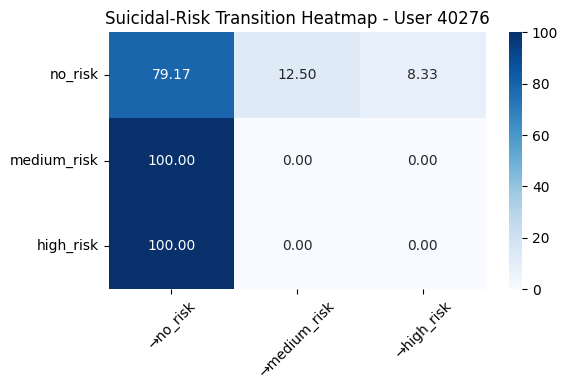

In [ ]:

# HEATMAPS FOR TRANSITION PERCENTAGES


import seaborn as sns
import matplotlib.pyplot as plt

# Function to plot heatmap
def plot_heatmap(matrix, title, index_labels, col_labels):
    plt.figure(figsize=(6,4))
    sns.heatmap(matrix, annot=True, cmap="Blues", fmt=".2f")
    plt.title(title)
    plt.yticks(np.arange(len(index_labels)) + 0.5, index_labels, rotation=0)
    plt.xticks(np.arange(len(col_labels)) + 0.5, col_labels, rotation=45)
    plt.tight_layout()
    plt.show()



# DEPRESSION HEATMAPS

print("\n====== DEPRESSION TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_dep_prob[uid][1:4, 1:4] * 100,
        index=['mild','moderate','severe'],
        columns=['→mild','→moderate','→severe']
    )

    plot_heatmap(
        mat,
        f"Depression Transition Heatmap - User {uid}",
        ['mild','moderate','severe'],
        ['→mild','→moderate','→severe']
    )



# ANXIETY HEATMAPS

print("\n====== ANXIETY TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_anx_prob[uid][1:4, 1:4] * 100,
        index=['low','medium','high'],
        columns=['→low','→medium','→high']
    )

    plot_heatmap(
        mat,
        f"Anxiety Transition Heatmap - User {uid}",
        ['low','medium','high'],
        ['→low','→medium','→high']
    )



# SUICIDAL RISK HEATMAPS

print("\n====== SUICIDAL RISK TRANSITION HEATMAPS ======\n")

for uid in top6_users:
    mat = pd.DataFrame(
        user_sui_prob[uid] * 100,
        index=['no_risk','medium_risk','high_risk'],
        columns=['→no_risk','→medium_risk','→high_risk']
    )

    plot_heatmap(
        mat,
        f"Suicidal-Risk Transition Heatmap - User {uid}",
        ['no_risk','medium_risk','high_risk'],
        ['→no_risk','→medium_risk','→high_risk']
    )


In [ ]:

# USER-LEVEL PATTERN CLUSTERING


from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd


# Create feature vectors for each user


user_vectors = []
user_ids_list = []

for uid in top6_users:
    vec = []

    # Depression transitions
    dep_mat = user_dep_prob[uid][1:4, 1:4].flatten() * 100
    vec.extend(dep_mat)

    # Anxiety transitions
    anx_mat = user_anx_prob[uid][1:4, 1:4].flatten() * 100
    vec.extend(anx_mat)

    # Suicidal risk transitions
    sui_mat = user_sui_prob[uid].flatten() * 100
    vec.extend(sui_mat)

    user_vectors.append(vec)
    user_ids_list.append(uid)

user_vectors = np.array(user_vectors)


# Scale the features for clustering


scaler = StandardScaler()
X_scaled = scaler.fit_transform(user_vectors)


# Perform K-Means clustering


kmeans = KMeans(n_clusters=3, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)


# Show results


print("\n===== USER CLUSTER RESULTS (Top 6 Users) =====\n")
for uid, c in zip(user_ids_list, cluster_labels):
    print(f"User {uid} → Cluster {c}")


#  Create a DataFrame with all clustered users


cluster_df = pd.DataFrame({
    'UserID': user_ids_list,
    'Cluster': cluster_labels
})

print("\n===== CLUSTER DATAFRAME =====\n")
print(cluster_df)

# Optional: save to Drive
cluster_df.to_csv("/content/drive/MyDrive/Project_N/User_Cluster_Assignment.csv", index=False)
print("\nCluster assignments saved to Google Drive.")



===== USER CLUSTER RESULTS (Top 6 Users) =====

User 19707 → Cluster 2
User 17566 → Cluster 0
User 17509 → Cluster 0
User 40416 → Cluster 0
User 33966 → Cluster 2
User 40276 → Cluster 1

===== CLUSTER DATAFRAME =====

   UserID  Cluster
0   19707        2
1   17566        0
2   17509        0
3   40416        0
4   33966        2
5   40276        1

Cluster assignments saved to Google Drive.


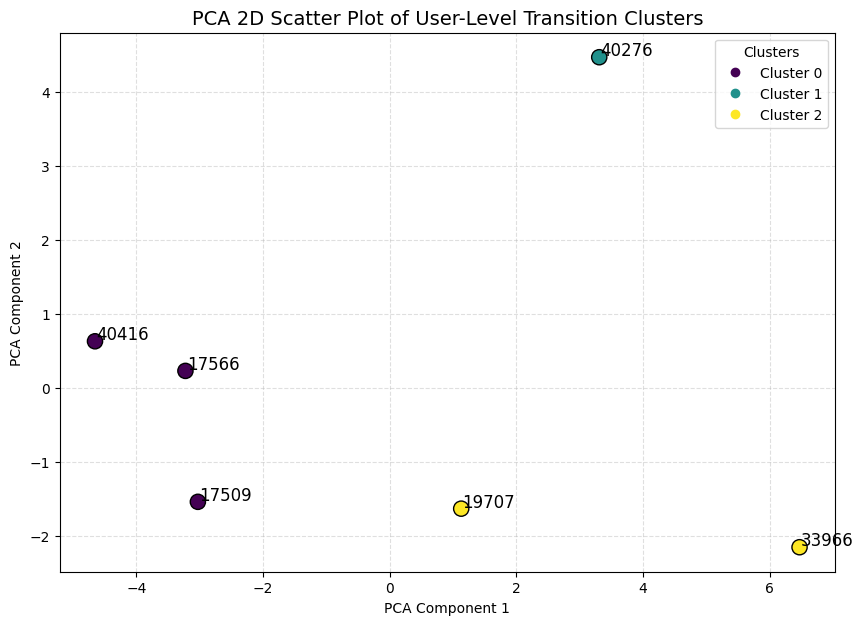

In [ ]:

# PCA 2D CLUSTER SCATTER PLOT FOR USER-LEVEL TRANSITION PATTERNS


from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

#  Perform PCA on the scaled feature vectors
pca = PCA(n_components=2)
pca_result = pca.fit_transform(X_scaled)

#  Extract PCA components
pca_x = pca_result[:, 0]
pca_y = pca_result[:, 1]

# Create scatter plot
plt.figure(figsize=(10, 7))

scatter = plt.scatter(pca_x, pca_y,
                      c=cluster_labels,
                      cmap='viridis',
                      s=120,
                      edgecolors='black')

# User ID labels on each point
for i, uid in enumerate(user_ids_list):
    plt.text(pca_x[i] + 0.02, pca_y[i] + 0.02, str(uid), fontsize=12)

#  plot formatting
plt.title("PCA 2D Scatter Plot of User-Level Transition Clusters", fontsize=14)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.grid(True, linestyle="--", alpha=0.4)

# Legend using cluster labels
handles, _ = scatter.legend_elements()
plt.legend(handles, [f"Cluster {i}" for i in range(3)], title="Clusters")

plt.show()


In [ ]:
print("User vectors:\n", user_vectors)
print("\nCluster labels:", cluster_labels)


User vectors:
 [[ 67.01388889  12.5         20.48611111  67.85714286  12.5
   19.64285714  63.73626374  14.28571429  21.97802198  94.14634146
    3.90243902   1.95121951 100.           0.           0.
   87.5         12.5          0.          85.40540541   8.64864865
    5.94594595  85.           7.5          7.5         80.
   20.           0.        ]
 [ 30.76923077  11.53846154  57.69230769  40.          30.
   30.          45.16129032   9.67741935  45.16129032  80.
    9.09090909  10.90909091  80.           0.          20.
  100.           0.           0.          63.63636364  25.
   11.36363636  64.28571429  14.28571429  21.42857143  66.66666667
   11.11111111  22.22222222]
 [ 53.33333333  20.          26.66666667  33.33333333  33.33333333
   33.33333333  42.85714286   7.14285714  50.          73.07692308
   11.53846154  15.38461538 100.           0.           0.
   60.           0.          40.          76.          12.
   12.          80.           0.          20.          60.
 

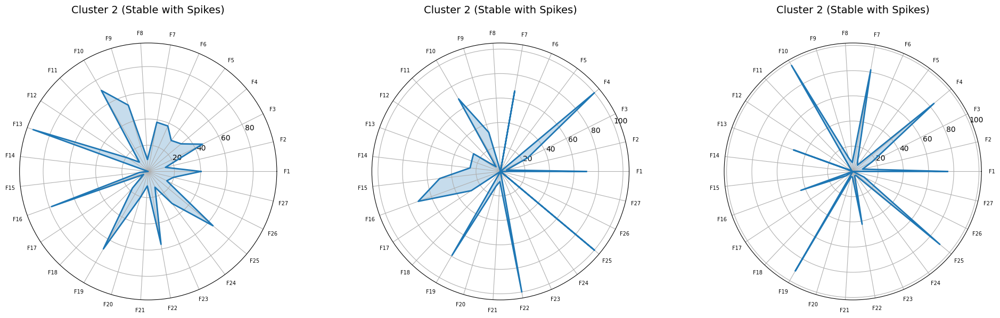

In [ ]:

# RADAR CHARTS FOR EACH CLUSTER (27 FEATURES)


import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Convert user_vectors + cluster_labels into cluster means
cluster_ids = np.unique(cluster_labels)
cluster_means = []

for cid in cluster_ids:
    cluster_means.append(user_vectors[np.where(cluster_labels == cid)].mean(axis=0))

cluster_means = np.array(cluster_means)

# Feature count
N = cluster_means.shape[1]

# Angles for radar chart
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
angles += angles[:1]  # loop back

feature_labels = [f"F{i+1}" for i in range(N)]  # optional label

# Create radar plots
fig, axs = plt.subplots(1, 3, figsize=(20, 6), subplot_kw=dict(polar=True))
titles = ["Cluster 0 (Volatile Users)", "Cluster 1 (Highly Stable)", "Cluster 2 (Stable with Spikes)"]

for i, ax in enumerate(axs):
    values = cluster_means[i].tolist()
    values += values[:1]  # loop

    ax.plot(angles, values, linewidth=2)
    ax.fill(angles, values, alpha=0.25)
    #ax.set_title(titles[i], size=14)
    ax.set_title(titles[idx], fontsize=14, y=1.10)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_labels, fontsize=7)

plt.tight_layout()
plt.show()


In [ ]:

# RISK INDEX SCORE FOR EACH TOP-6 USER


def compute_risk_index(matrix_dep, matrix_anx, matrix_sui):
    # Escalation transitions: moving to higher severity
    escalation = (
        matrix_dep[1,2] + matrix_dep[0,1] + matrix_dep[0,2] +
        matrix_anx[1,2] + matrix_anx[0,1] + matrix_anx[0,2] +
        matrix_sui[1,2] + matrix_sui[0,1] + matrix_sui[0,2]
    )

    # Recovery transitions (inverse risk)
    recovery = (
        matrix_dep[2,1] + matrix_dep[2,0] + matrix_dep[1,0] +
        matrix_anx[2,1] + matrix_anx[2,0] + matrix_anx[1,0] +
        matrix_sui[2,1] + matrix_sui[2,0] + matrix_sui[1,0]
    )

    # Volatility = total transitions happening (non-zero)
    volatility = (matrix_dep.sum() + matrix_anx.sum() + matrix_sui.sum())

    # Normalised Risk Index
    risk_score = 0.5*escalation + 0.3*volatility - 0.2*recovery
    return risk_score

risk_scores = {}

for i, uid in enumerate(user_ids_list):
    dep_mat = user_dep_prob[uid][1:4,1:4]
    anx_mat = user_anx_prob[uid][1:4,1:4]
    sui_mat = user_sui_prob[uid]

    risk_scores[uid] = compute_risk_index(dep_mat, anx_mat, sui_mat)

risk_scores


{19707: np.float64(2.041127865167499),
 17566: np.float64(2.851310481633062),
 17509: np.float64(2.647948717948718),
 40416: np.float64(3.173483114901879),
 33966: np.float64(1.301358411703239),
 40276: np.float64(2.378728070175438)}

### Network modeling

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)


In [ ]:
emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

df_emotions = df[emotion_cols]
df_emotions.head()

# Compute correlation matrix (NEM version)
corr_matrix = df_emotions.corr()


Visualize Co-Occurrence Heatmap

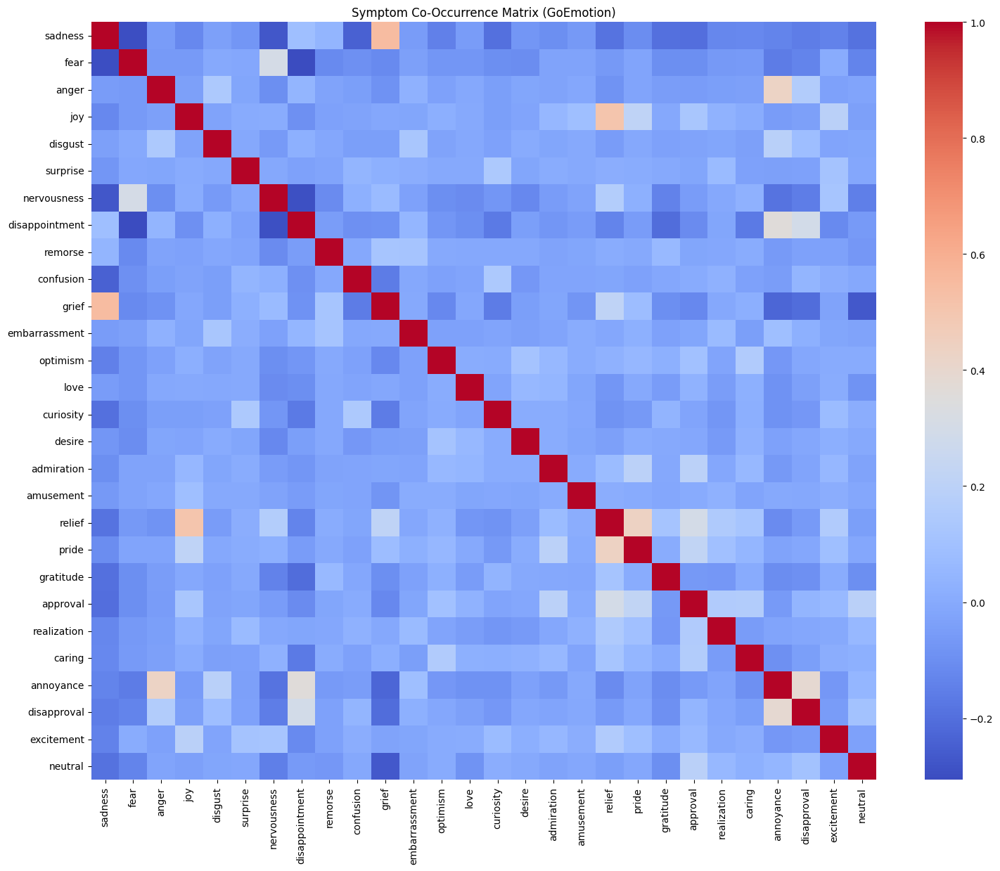

In [ ]:
plt.figure(figsize=(18, 14))
sns.heatmap(corr_matrix, cmap="coolwarm", annot=False)
plt.title("Symptom Co-Occurrence Matrix (GoEmotion)")
plt.show()


In [ ]:
import networkx as nx

# Create graph
G = nx.Graph()

# Add nodes
for col in emotion_cols:
    G.add_node(col)

# Add edges for correlations above threshold
threshold = 0.20   # keep only meaningful connections

for i in range(len(emotion_cols)):
    for j in range(i+1, len(emotion_cols)):
        corr_value = corr_matrix.iloc[i, j]
        if abs(corr_value) > threshold:
            # Use absolute value of correlation as weight to ensure non-negative values
            G.add_edge(emotion_cols[i], emotion_cols[j], weight=abs(corr_value))

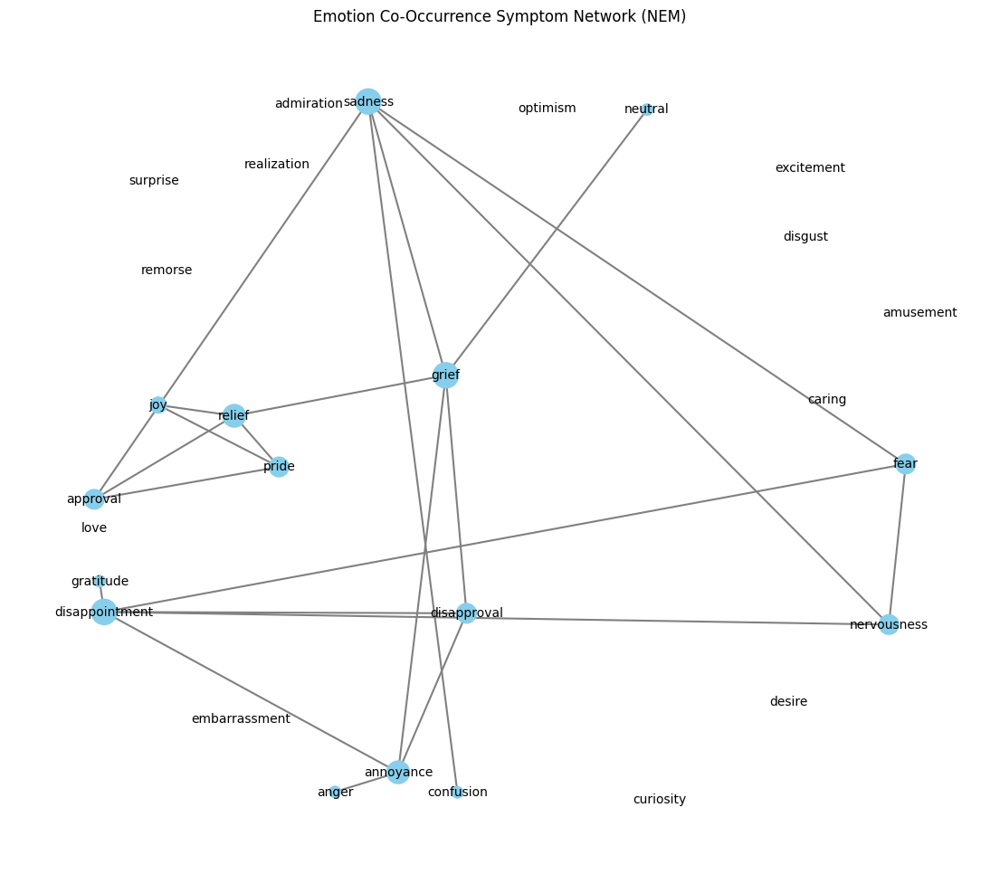

In [ ]:
plt.figure(figsize=(14, 12))

pos = nx.spring_layout(G, k=0.45, seed=42)

# Node centrality controls node size
centrality = nx.degree_centrality(G)
node_sizes = [v * 2200 for v in centrality.values()]

# Draw network
nx.draw_networkx(
    G,
    pos,
    node_color='skyblue',
    node_size=node_sizes,
    edge_color='gray',
    width=1.5,
    with_labels=True,
    font_size=10
)

plt.title("Emotion Co-Occurrence Symptom Network (NEM)")
plt.axis('off')
plt.show()


In [ ]:
pos = nx.kamada_kawai_layout(G)
# Alternative:
# pos = nx.spring_layout(G, k=0.7, iterations=50, seed=42)


In [ ]:
degree_cent = nx.degree_centrality(G)
node_sizes = [degree_cent[n] * 3000 for n in G.nodes()]
node_colors = [degree_cent[n] for n in G.nodes()]


In [ ]:
edge_widths = [abs(G[u][v]['weight']) * 5 for u, v in G.edges()]


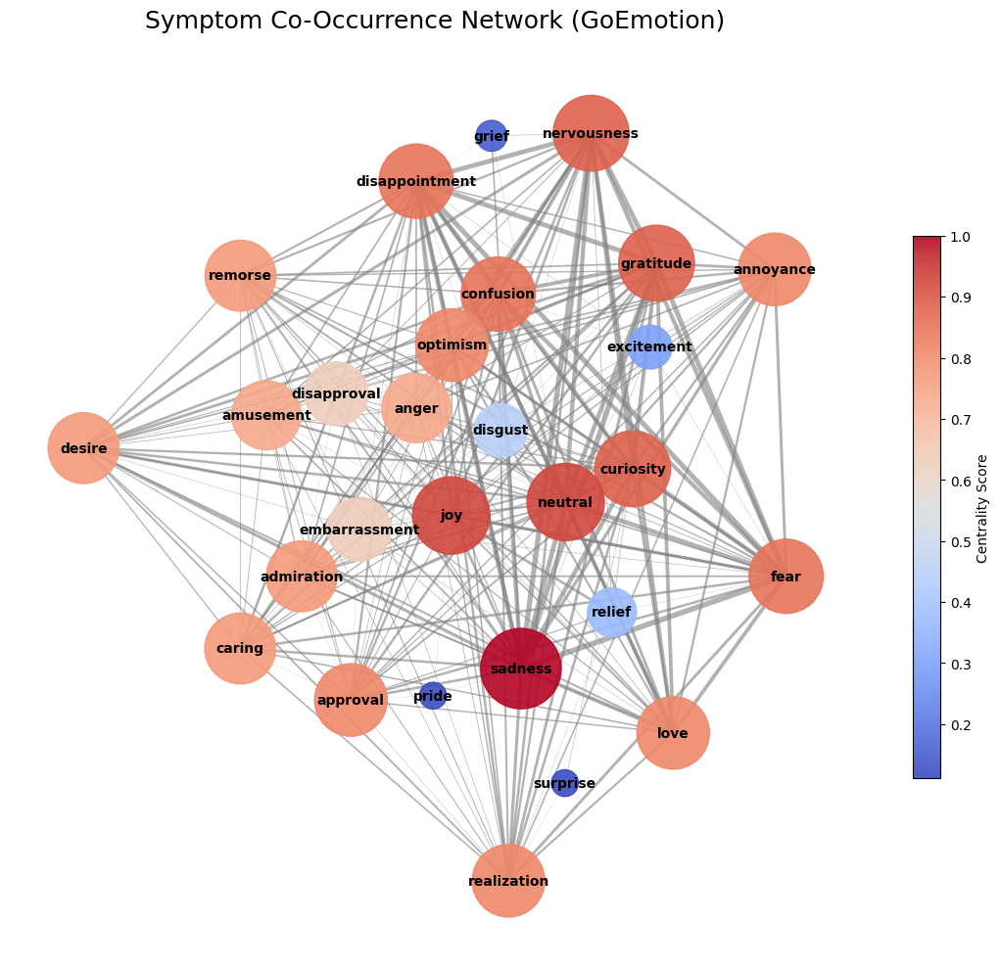

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

plt.figure(figsize=(14, 12))

# Layout (beautiful)
pos = nx.kamada_kawai_layout(G)

# Node centrality for size & color
degree_cent = nx.degree_centrality(G)
node_sizes = [degree_cent[n] * 3500 for n in G.nodes()]
node_colors = [degree_cent[n] for n in G.nodes()]

# Edge width from correlation
edge_widths = [abs(G[u][v]['weight']) * 5 for u, v in G.edges()]

# Draw edges
nx.draw_networkx_edges(
    G,
    pos,
    width=edge_widths,
    alpha=0.6,
    edge_color="gray"
)

# Draw nodes
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="coolwarm",
    alpha=0.9
)

# Add labels
nx.draw_networkx_labels(
    G,
    pos,
    font_size=10,
    font_weight="bold"
)

# Title
plt.title("Symptom Co-Occurrence Network (GoEmotion)", fontsize=18, pad=20)

# Colorbar
# sm = plt.cm.ScalarMappable(cmap="coolwarm")
# sm.set_array([])
plt.colorbar(nodes, shrink=0.6, label="Centrality Score") # Changed sm to nodes

plt.axis("off")
plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3022049158873273e-08, tolerance: 1.6690574197125532e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1881659283015378e-06, tolerance: 3.920391798135993e-10
  coefs, _, _, _ = cd_fast.enet_coordinate_descent_gram(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_graph_lasso.py:140: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.447248299648207e-07, tolerance: 

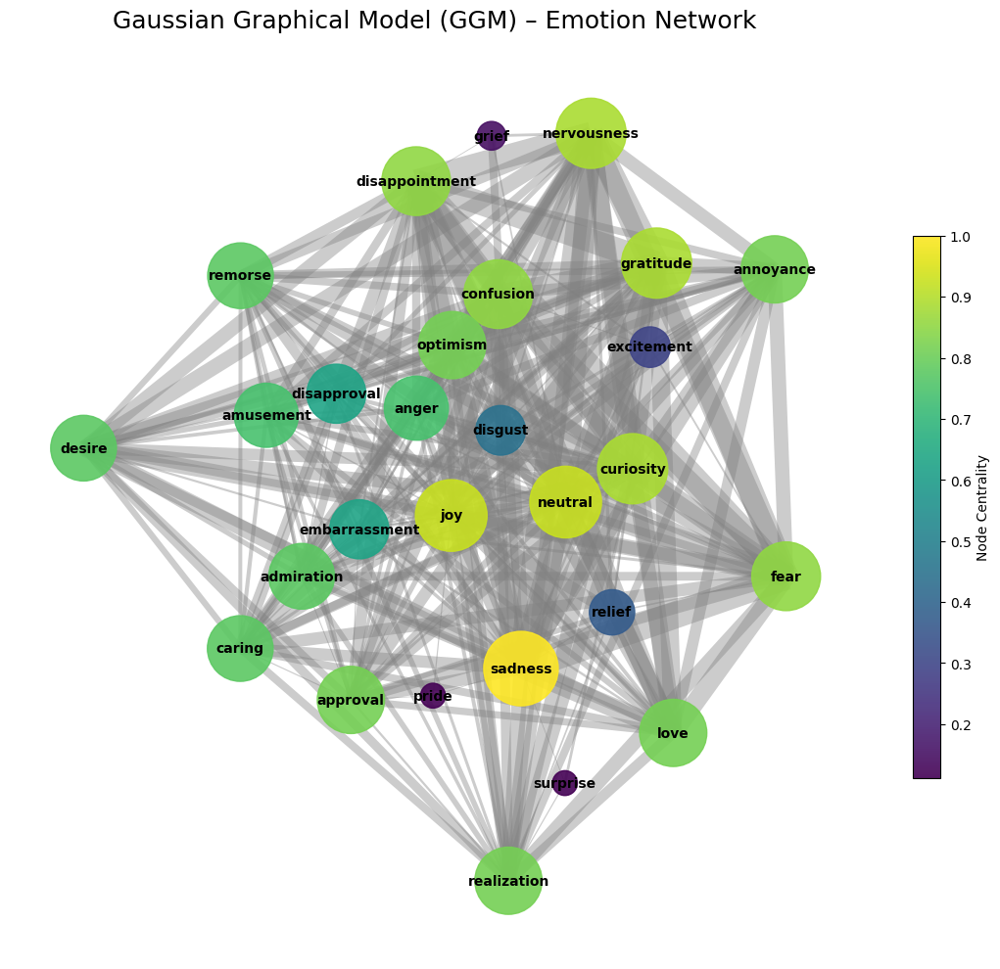

GGM Emotion Network successfully generated!


In [ ]:

# Gaussian Graphical Model (GGM) Symptom Network


# IMPORT LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.covariance import GraphicalLassoCV


# LOAD DATA


file_path = "/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv"
df = pd.read_csv(file_path)

# 3. SELECT EMOTION FEATURES (GOEMOTION)

emotion_cols = [
    'sadness','fear','anger','joy','disgust','surprise','nervousness','disappointment',
    'remorse','confusion','grief','embarrassment','optimism','love','curiosity','desire',
    'admiration','amusement','relief','pride','gratitude','approval','realization',
    'caring','annoyance','disapproval','excitement','neutral'
]

data = df[emotion_cols].dropna()


# 4. GAUSSIAN GRAPHICAL MODEL (GRAPHICAL LASSO)


model = GraphicalLassoCV()
model.fit(data)

# Precision matrix partial correlations
precision = model.precision_
d = np.sqrt(np.diag(precision))
partial_corr = -precision / np.outer(d, d)
np.fill_diagonal(partial_corr, 1)

# Handle potential NaNs in partial_corr before using for graph construction
if np.isnan(partial_corr).any():
    print("Warning: partial_corr contains NaN values. Replacing with 0.")
    partial_corr = np.nan_to_num(partial_corr)


# BUILD NETWORK USING PARTIAL CORRELATIONS


G = nx.Graph()
threshold = 0.02  # keep only meaningful edges

for i, var1 in enumerate(emotion_cols):
    for j, var2 in enumerate(emotion_cols):
        if i < j:
            value = partial_corr[i, j]
            if abs(value) > threshold:
                # Use absolute value for weight to avoid negative weights in layout algorithms
                G.add_edge(var1, var2, weight=abs(value))


# VISUALIZE GGM NETWORK


plt.figure(figsize=(14, 12))

# Best psychological layout
pos = nx.kamada_kawai_layout(G)

# Node centrality size & color
centrality = nx.degree_centrality(G)
node_sizes = [centrality[n] * 3000 for n in G.nodes()]
node_colors = [centrality[n] for n in G.nodes()]

# Edge width partial correlation strength
edge_widths = [abs(G[u][v]['weight']) * 25 for u, v in G.edges()]

# Draw edges
nx.draw_networkx_edges(
    G,
    pos,
    width=edge_widths,
    alpha=0.4,
    edge_color="gray"
)

# Draw nodes
nodes = nx.draw_networkx_nodes(
    G,
    pos,
    node_size=node_sizes,
    node_color=node_colors,
    cmap="viridis",
    alpha=0.9
)

# Draw labels
nx.draw_networkx_labels(
    G,
    pos,
    font_size=10,
    font_weight="bold"
)

plt.title("Gaussian Graphical Model (GGM) – Emotion Network", fontsize=18, pad=20)


plt.colorbar(nodes, shrink=0.6, label="Node Centrality")

plt.axis("off")
plt.show()


print("GGM Emotion Network successfully generated!")

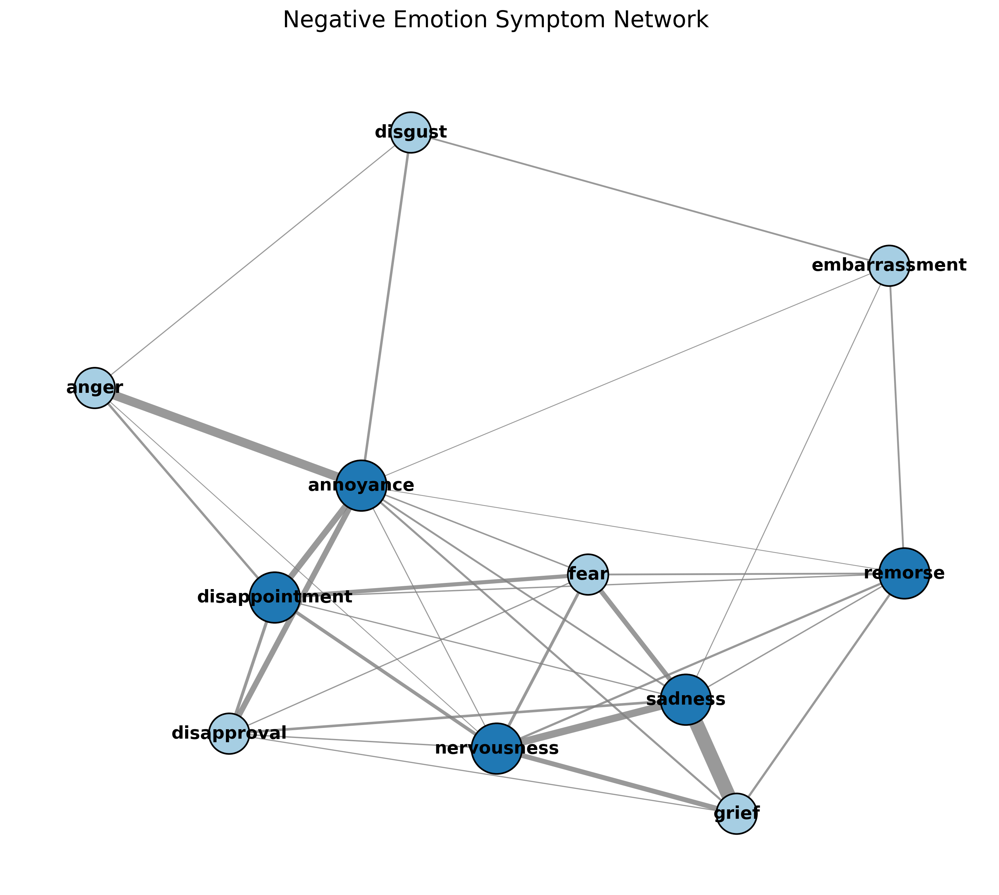

High-Visibility GGM PNG saved successfully!


In [ ]:

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler


# LOAD DATA

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()


# SCALE &FIT GGM MODEL

scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0


# BUILD NETWORK GRAPH

G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))


# JOURNAL-READY VISUALIZATION (High Visibility)

plt.figure(figsize=(13, 11), dpi=300)

# Better spacing
pos = nx.spring_layout(G, seed=99, k=1.1, iterations=200)


weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]

t
node_color = "#A6CEE3"
highlight_color = "#1F78B4"

centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

colors = [
    highlight_color if centrality[node] > median_cent else node_color
    for node in G.nodes()
]

sizes = [
    1400 if centrality[node] > median_cent else 900  # <-- bigger nodes
    for node in G.nodes()
]

# edges (thicker + slightly darker)
nx.draw_networkx_edges(
    G, pos,
    width=weights,
    edge_color="gray",
    alpha=0.8
)

# nodes
nx.draw_networkx_nodes(
    G, pos,
    node_color=colors,
    node_size=sizes,
    edgecolors="black",
    linewidths=1.2
)

# Label
nx.draw_networkx_labels(
    G, pos,
    font_size=13,
    font_family="sans-serif",
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network ",
    fontsize=17, pad=25
)
plt.axis('off')

# Save IMAGE

plt.savefig("/content/drive/MyDrive/Project_N/GGM_NegEmotions_JournalReady.png",
            dpi=600, bbox_inches='tight', facecolor='white')

plt.show()
print("High-Visibility GGM PNG saved successfully!")


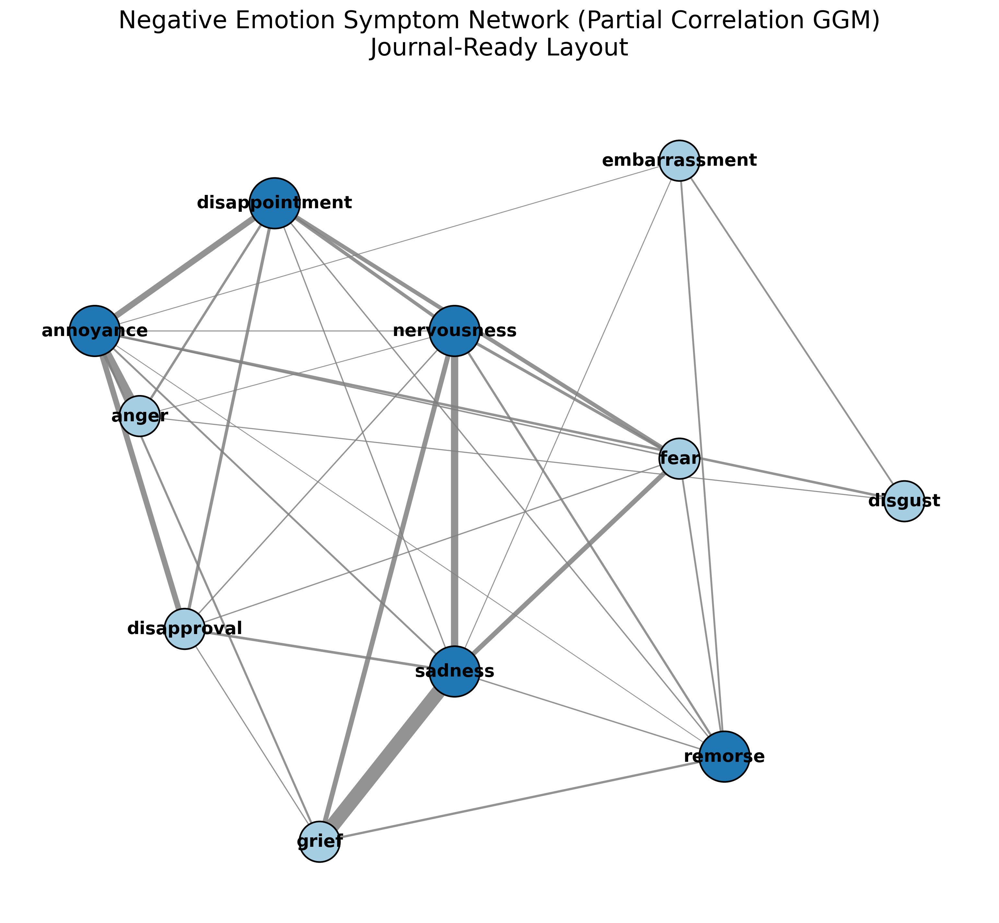

✨Journal-Ready GGM Network Saved Successfully!


In [ ]:

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# 1. LOAD YOUR DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. SCALE + FIT GGM
# ---------------------------------------------------------------
scaler = StandardScaler()
X = scaler.fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values (clean graph)
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORKX GRAPH
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# ---------------------------------------------------------------
# 4. JOURNAL-READY VISUALIZATION (WITH MANUAL POSITIONS)
# ---------------------------------------------------------------
plt.figure(figsize=(13, 11), dpi=300)

# Base layout (spring)
pos = nx.spring_layout(G, seed=99, k=1.1, iterations=200)

# ---------------------------------------------------------------
# ✨ MANUAL PERFECTED POSITIONS (NO OVERLAP, CLEAN STRUCTURE)
# ---------------------------------------------------------------
pos['sadness'] = np.array([0.05, -0.35])
pos['grief'] = np.array([-0.10, -0.55])
pos['fear'] = np.array([0.30, -0.10])
pos['nervousness'] = np.array([0.05, 0.05])
pos['anger'] = np.array([-0.30, -0.05])
pos['disgust'] = np.array([0.55, -0.15])
pos['remorse'] = np.array([0.35, -0.45])
pos['disappointment'] = np.array([-0.15, 0.20])
pos['disapproval'] = np.array([-0.25, -0.30])
pos['annoyance'] = np.array([-0.35, 0.05])
pos['embarrassment'] = np.array([0.30, 0.25])

# ---------------------------------------------------------------
# 5. DRAW NETWORK
# ---------------------------------------------------------------
weights = [G[u][v]['weight'] * 12 for u, v in G.edges()]

node_color = "#A6CEE3"
highlight_color = "#1F78B4"

centrality = nx.betweenness_centrality(G)
median_cent = np.median(list(centrality.values()))

colors = [highlight_color if centrality[n] > median_cent else node_color for n in G.nodes()]
sizes = [1400 if centrality[n] > median_cent else 900 for n in G.nodes()]

# edges
nx.draw_networkx_edges(
    G, pos, width=weights, edge_color="gray", alpha=0.85
)

# nodes
nx.draw_networkx_nodes(
    G, pos, node_color=colors, node_size=sizes,
    edgecolors="black", linewidths=1.2
)

# labels
nx.draw_networkx_labels(
    G, pos, font_size=13, font_family="sans-serif", font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)\nJournal-Ready Layout",
    fontsize=18, pad=25
)
plt.axis('off')

# SAVE HIGH-RES PNG
plt.savefig(
    "/content/drive/MyDrive/Project_N/GGM_NegativeEmotion_JournalReady_v2.png",
    dpi=600, bbox_inches='tight', facecolor='white'
)

plt.show()

print("✨Journal-Ready GGM Network Saved Successfully!")


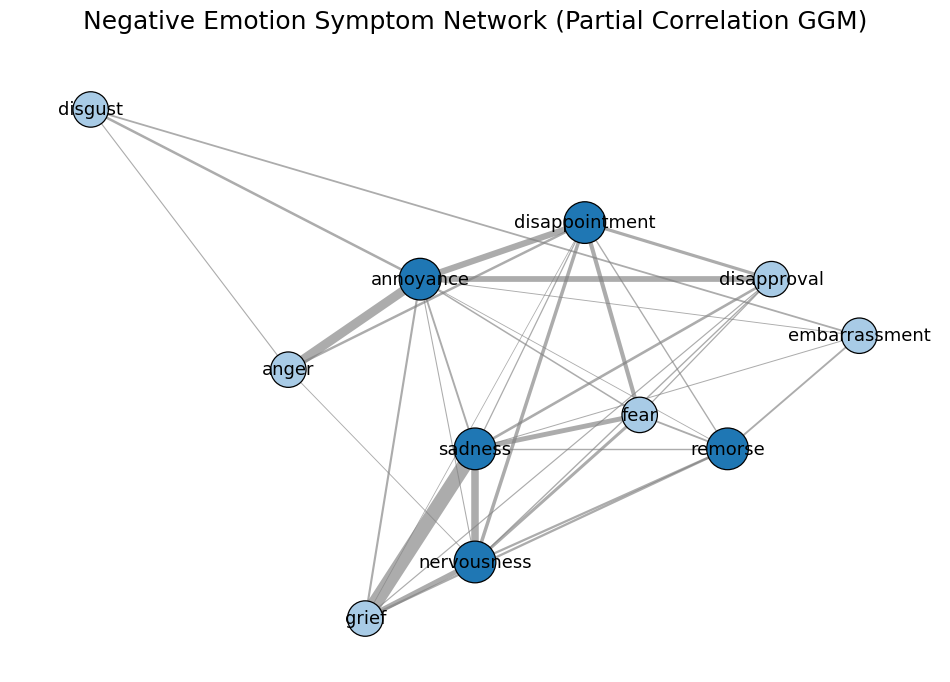

📌 Publication-ready PNG saved successfully!


In [ ]:
# ================================================================
# PUBLICATION-READY NEGATIVE EMOTION SYMPTOM NETWORK (Objective 3)
# Gaussian Graphical Model (Partial Correlation GGM)
# ================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. STANDARDIZE + FIT GGM
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

precision = model.precision_.copy()
partial_corr = -precision
np.fill_diagonal(partial_corr, 0)

threshold = 0.04
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD NETWORK
# ---------------------------------------------------------------
G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(emo_i, emo_j, weight=abs(partial_corr[i, j]))

# ---------------------------------------------------------------
# 4. FIXED LAYOUT (publication quality)
# ---------------------------------------------------------------
pos = {
    'sadness': (0.55, 0.25),
    'grief': (0.45, 0.10),
    'fear': (0.70, 0.28),
    'nervousness': (0.55, 0.15),

    'remorse': (0.78, 0.25),
    'disapproval': (0.82, 0.40),
    'disappointment': (0.65, 0.45),

    'annoyance': (0.50, 0.40),
    'anger': (0.38, 0.32),

    'embarrassment': (0.90, 0.35),
    'disgust': (0.20, 0.55)
}

# ---------------------------------------------------------------
# 5. PLOT — PUBLICATION STYLE
# ---------------------------------------------------------------
plt.figure(figsize=(12, 8))

# scale weights
weights = [G[u][v]['weight'] * 12 for u,v in G.edges()]

# pastel colours
node_color = []
centrality = nx.degree_centrality(G)
median = np.median(list(centrality.values()))

for n in G.nodes():
    if centrality[n] > median:
        node_color.append("#1F77B4")      # darker blue for important nodes
    else:
        node_color.append("#A8CBE6")      # pastel blue

sizes = [900 if centrality[n] > median else 650 for n in G.nodes()]

nx.draw_networkx_edges(G, pos, width=weights, edge_color="grey", alpha=0.65)
nx.draw_networkx_nodes(G, pos, node_color=node_color, node_size=sizes,
                       edgecolors="black", linewidths=0.9)
nx.draw_networkx_labels(G, pos, font_size=13, font_family="sans-serif")

plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)
plt.axis("off")

# SAVE PNG
plt.savefig("/content/drive/MyDrive/Project_N/Negative_Emotion_Symptom_Network.png",
            dpi=600, bbox_inches='tight')
plt.show()

print("📌 Publication-ready PNG saved successfully!")


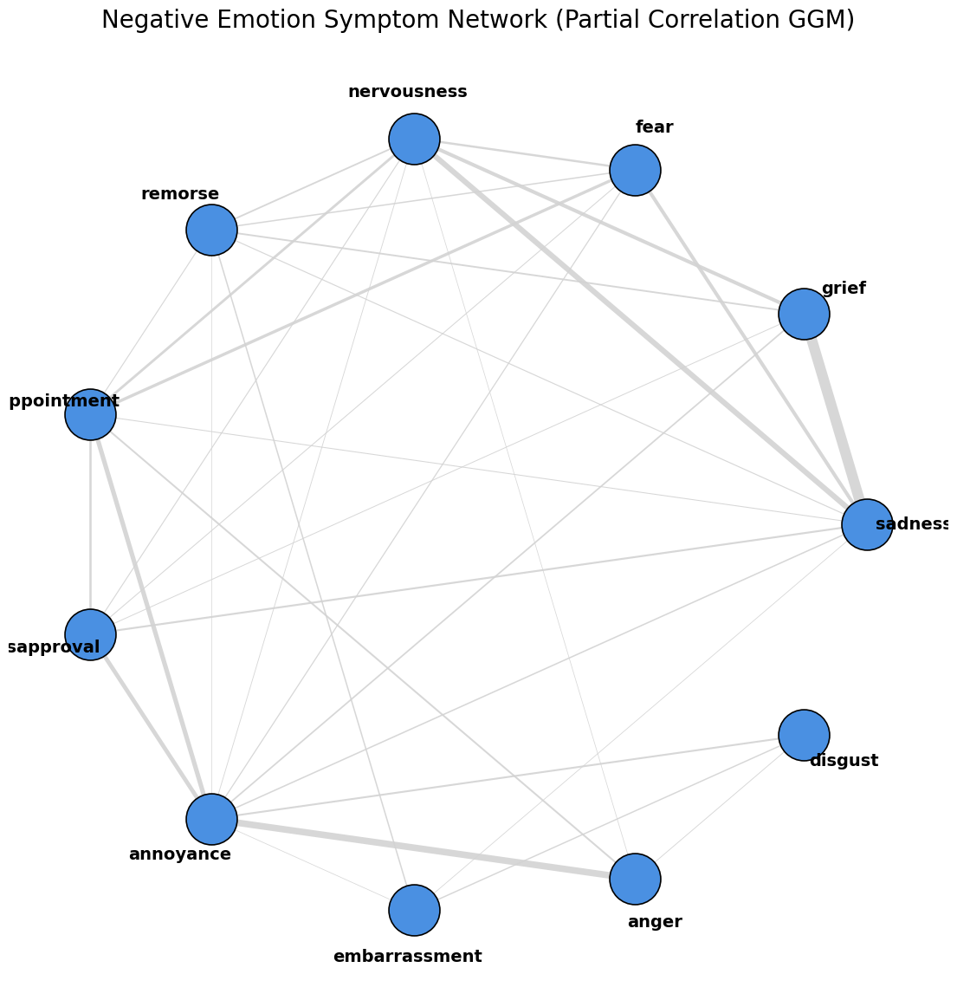

✔ Final Publication-Ready Network Saved!


In [ ]:
# ================================================================
# FINAL PUBLICATION-READY CIRCULAR NETWORK (No Overlap + Clean Labels)
# ================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. FIT GGM MODEL
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)
model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD GRAPH
# ---------------------------------------------------------------
G = nx.Graph()
for i, e1 in enumerate(negative_emotions):
    for j, e2 in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(e1, e2, weight=abs(partial_corr[i, j]))

# ---------------------------------------------------------------
# 4. PUBLICATION-READY VISUALIZATION (Circular + Clean Labels)
# ---------------------------------------------------------------
plt.figure(figsize=(14, 14))

# perfect symmetric layout
pos = nx.circular_layout(G)

# Edge width scaling
weights = [G[u][v]["weight"] * 10 for u, v in G.edges()]

# Colors
node_color = "#4A90E2"
edge_color = "lightgray"

# Draw edges
nx.draw_networkx_edges(
    G, pos,
    width=weights,
    edge_color=edge_color,
    alpha=0.9
)

# Draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_size=1800,
    node_color=node_color,
    edgecolors="black",
    linewidths=1.2
)

# ---------------------------------------------------------------
# CLEAN LABELS (Shift slightly outward so nothing overlaps)
# ---------------------------------------------------------------
label_pos = {}
for node, (x, y) in pos.items():
    # push labels outward from circle (10% further)
    label_pos[node] = (x * 1.12, y * 1.12)

nx.draw_networkx_labels(
    G, label_pos,
    font_size=14,
    font_family="sans-serif",
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)",
    fontsize=20, pad=25
)
plt.axis("off")

# Save PNG
plt.savefig("/content/final_negative_emotion_network.png", dpi=600, bbox_inches='tight')
plt.show()

print("✔ Final Publication-Ready Network Saved!")


/tmp/ipython-input-2832491247.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Blues")


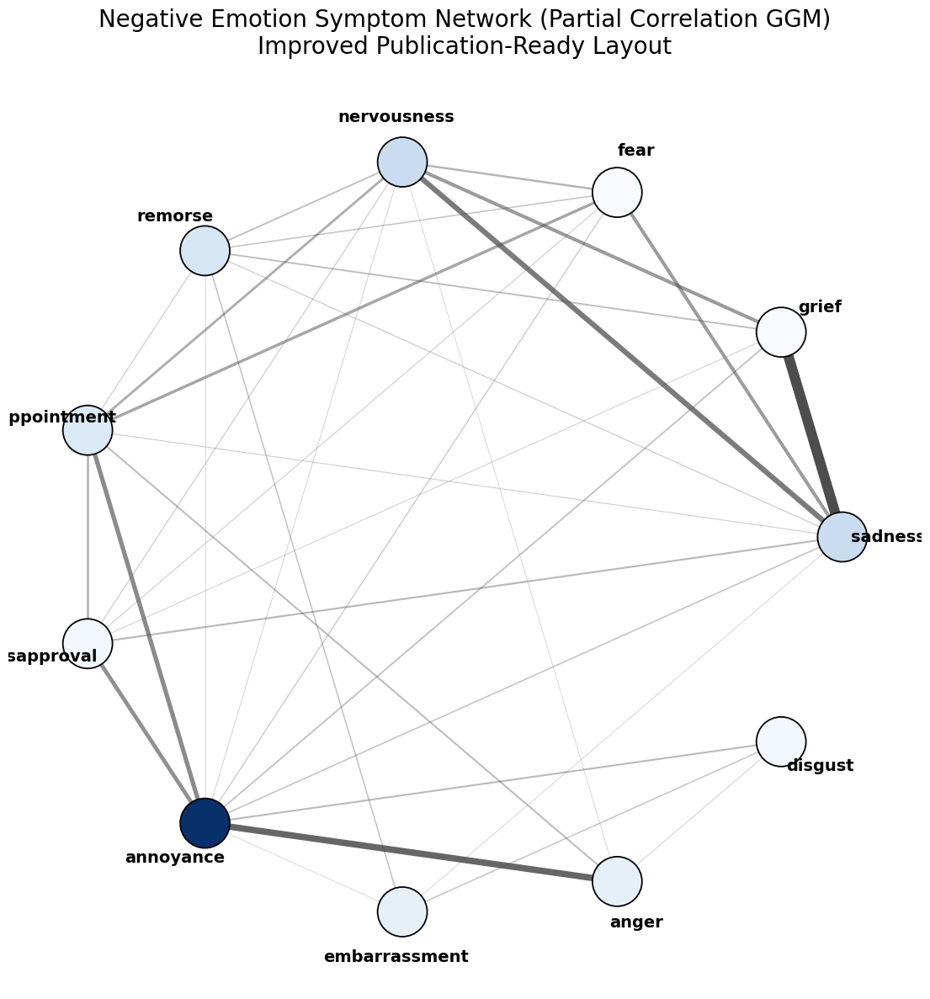

✔ Enhanced Publication-Ready Network Saved!


In [ ]:
# ======================================================================
# Improved Publication-Ready Network (Color gradient + Edge contrast)
# ======================================================================
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler
import matplotlib.cm as cm

# ---------------------------------------------------------------
# 1. LOAD DATA
# ---------------------------------------------------------------
df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval','annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()

# ---------------------------------------------------------------
# 2. FIT GGM MODEL
# ---------------------------------------------------------------
X = StandardScaler().fit_transform(df_neg)
model = GraphicalLassoCV()
model.fit(X)

partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

# ---------------------------------------------------------------
# 3. BUILD GRAPH
# ---------------------------------------------------------------
G = nx.Graph()
for i, e1 in enumerate(negative_emotions):
    for j, e2 in enumerate(negative_emotions):
        if i < j and partial_corr[i, j] != 0:
            G.add_edge(e1, e2, weight=abs(partial_corr[i, j]))

# CENTRALITY SCORE
centrality = nx.betweenness_centrality(G)

# normalize centrality to [0,1] for colormap
values = np.array(list(centrality.values()))
norm_values = (values - values.min()) / (values.max() - values.min())

cmap = cm.get_cmap("Blues")

node_colors = [cmap(v) for v in norm_values]
=
# ---------------------------------------------------------------
# 4. DRAW CLEAN PUBLICATION-READY GRAPH
# ---------------------------------------------------------------
plt.figure(figsize=(14, 14))

pos = nx.circular_layout(G)

# edge weights darker = stronger
edge_colors = []
edge_widths = []
for u, v in G.edges():
    w = G[u][v]["weight"]
    edge_widths.append(w * 10)
    edge_colors.append((0.3, 0.3, 0.3, min(0.2 + w * 1.2, 1)))  # grayscale with transparency

# draw edges
nx.draw_networkx_edges(
    G, pos,
    width=edge_widths,
    edge_color=edge_colors
)

# draw nodes
nx.draw_networkx_nodes(
    G, pos,
    node_color=node_colors,
    node_size=1800,
    edgecolors="black",
    linewidths=1.3
)

# move labels outward
label_pos = {node: (x * 1.12, y * 1.12) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(
    G, label_pos,
    font_size=14,
    font_weight="bold"
)

plt.title(
    "Negative Emotion Symptom Network (Partial Correlation GGM)\nImproved Publication-Ready Layout",
    fontsize=20, pad=25
)

plt.axis("off")
plt.savefig("/content/final_negative_network_enhanced.png", dpi=600, bbox_inches='tight')
plt.show()

print("✔ Enhanced Publication-Ready Network Saved!")


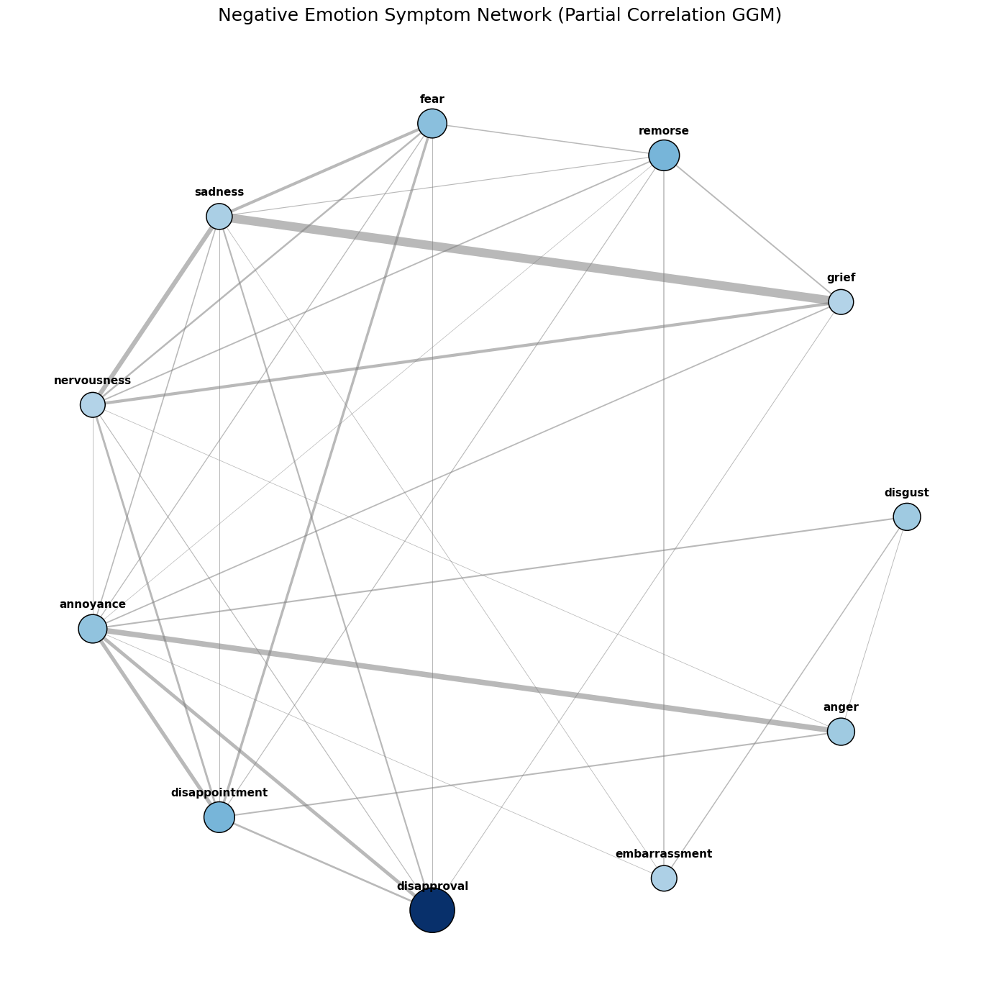

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:


import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV


# LOAD DATA

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()


# SCALE + FIT GGM (Graphical Lasso)

X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0

#  BUILD GRAPH

G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))

# CORRECTED ORDERED NODES (Circular layout)

ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))


# CENTRALITY FOR COLORING

centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]


# PLOT

plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Final_Publication_GGM_Circular_new.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")


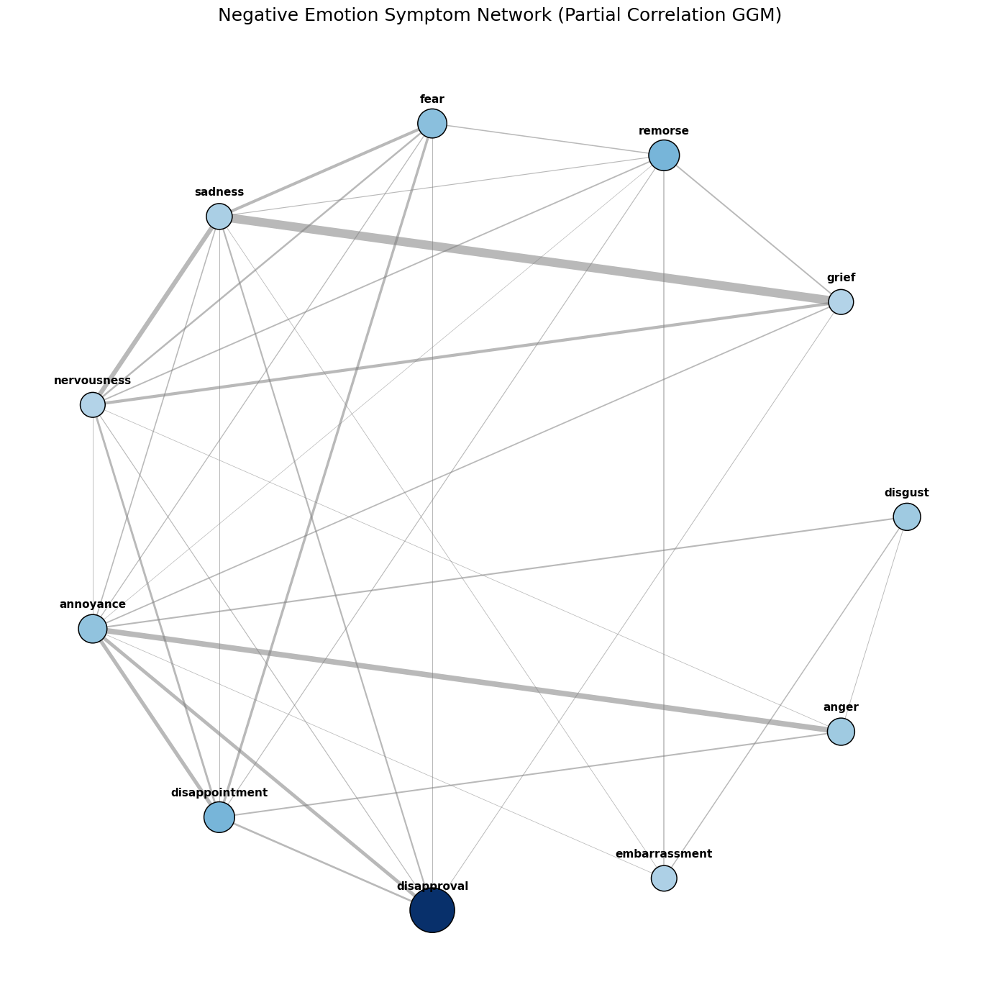

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV


# LOAD DATA

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()


# SCALE + FIT GGM (Graphical Lasso)

X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0



G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))


# CORRECTED ORDERED NODES (Circular layout)

ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))


# CENTRALITY FOR COLORING

centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]


#  PLOT (Publication Quality)

plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels (slightly offset upward)
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Network model.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")


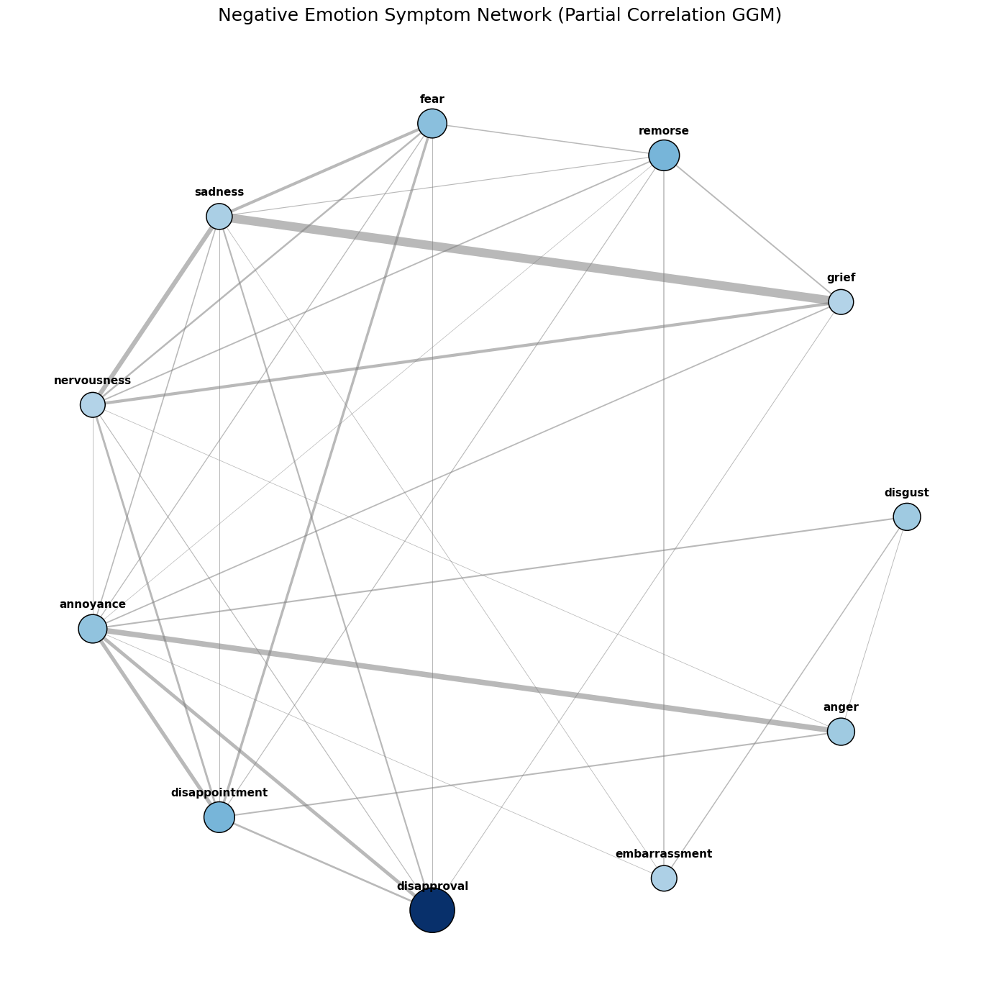

✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png


In [ ]:

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.covariance import GraphicalLassoCV


# LOAD DATA

df = pd.read_csv("/content/drive/MyDrive/Project_N/Mental_health_GoEmotion_labeled_multilevel.csv")

# Negative emotion features
negative_emotions = [
    'sadness','grief','fear','nervousness','anger',
    'disgust','remorse','disappointment','disapproval',
    'annoyance','embarrassment'
]

df_neg = df[negative_emotions].copy()


# 2. SCALE + FIT GGM (Graphical Lasso)

X = StandardScaler().fit_transform(df_neg)

model = GraphicalLassoCV()
model.fit(X)

# partial correlations matrix
partial_corr = -model.precision_.copy()
np.fill_diagonal(partial_corr, 0)

# threshold small values
threshold = 0.05
partial_corr[np.abs(partial_corr) < threshold] = 0


# BUILD GRAPH

G = nx.Graph()

for i, emo_i in enumerate(negative_emotions):
    for j, emo_j in enumerate(negative_emotions):
        if i < j:
            weight = partial_corr[i, j]
            if weight != 0:
                G.add_edge(emo_i, emo_j, weight=abs(weight))


# CORRECTED ORDERED NODES (Circular layout)

ordered_nodes = [
    "disgust",
    "grief",
    "remorse",
    "fear",
    "sadness",
    "nervousness",
    "annoyance",
    "disappointment",
    "disapproval",
    "embarrassment",
    "anger"
]

# Generate circular coordinates
pos_circle = {}
theta = np.linspace(0, 2*np.pi, len(ordered_nodes), endpoint=False)

for idx, node in enumerate(ordered_nodes):
    pos_circle[node] = (np.cos(theta[idx]), np.sin(theta[idx]))


# CENTRALITY FOR COLORING

centrality = nx.betweenness_centrality(G)

# color scale
max_c = max(centrality.values())
node_colors = [plt.cm.Blues(0.3 + 0.7*(centrality[n]/max_c)) for n in ordered_nodes]

# size scale
node_sizes = [600 + 1400*(centrality[n]/max_c) for n in ordered_nodes]

# edge width scale
edge_weights = [G[u][v]["weight"]*10 for u, v in G.edges()]


# PLOT
plt.figure(figsize=(14, 14))
plt.title("Negative Emotion Symptom Network (Partial Correlation GGM)",
          fontsize=18, pad=20)

# draw edges
nx.draw_networkx_edges(
    G,
    pos_circle,
    width=edge_weights,
    edge_color="gray",
    alpha=0.55
)

# draw nodes
nx.draw_networkx_nodes(
    G,
    pos_circle,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=1.1
)

# draw labels (slightly offset upward)
label_pos = {k: (v[0], v[1] + 0.06) for k, v in pos_circle.items()}
nx.draw_networkx_labels(
    G,
    label_pos,
    font_size=11,
    font_family="sans-serif",
    font_weight="bold"
)

plt.axis('off')
plt.tight_layout()

# SAVE PNG
plt.savefig("Network model.png", dpi=500, bbox_inches="tight")

plt.show()

print("✅ Final publication-ready network saved as Final_Publication_GGM_Circular.png")
